In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import pyplot
import matplotlib.pylab as plt
import numba
from pprint import pprint
pd.options.display.expand_frame_repr = False

In [2]:
dt = pd.read_csv("Population_dataset.csv", delimiter=',')

In [3]:
del dt['FREQUENCY']
dt = dt.loc[~dt['LOCATION'].isin(['OECD', 'G-7'])]
del dt['LOCATION']
del dt['SUBJECT']
del dt['SEX']
del dt['TIME']
dt = dt.loc[~dt['Unit'].isin(['Percentage'])]
del dt['Unit']
del dt['Unit Code']
del dt['PowerCode']
del dt['PowerCode Code']
eh2null = dt.isnull()
nullcolumns_eh2 = []
for column in eh2null.columns:
    tf = True
    for i in eh2null[column]:
        if i != True:
            tf = False
            break
    if tf:
        nullcolumns_eh2.append(column)
print('del', nullcolumns_eh2)
for i in nullcolumns_eh2:
    del dt[i]

del ['Reference Period Code', 'Reference Period']


In [4]:
# dt = dt.where(dt['Flags'] == 'Break').dropna()
del dt['Flags']
del dt['Flag Codes']

In [5]:
print(dt["Subject"].unique())
dt

['Population (hist5)  40-44' 'Population (hist5)  45-49'
 'Population (hist5)  80-84' 'Population (hist5)  20-24'
 'Population (hist5)  55-59' 'Population (hist5)  25-29'
 'Population (hist5)  60-64' 'Population (hist5) All ages'
 'Population (hist5)  35-39' 'Working Age (20-64) per Pension Age (+65)'
 'Population (hist5)  00-04' 'Population (hist5)  05-09'
 'Working Age (15-64) per Pension Age (+65)' 'Population (hist5)  10-14'
 'Population (hist5)  30-34' 'Population (hist5)  15-19'
 'Population (hist5)  75-79' 'Population (hist5)  70-74'
 'Population (hist5)  50-54' 'Population (hist5)  85+'
 'Population (hist5)  65-69']


,Country,Subject,Sex,Frequency,Time,Value
0,Germany,Population (hist5) 40-44,Females,Annual,2000,3080709.0
1,Germany,Population (hist5) 40-44,Females,Annual,2001,3174188.0
2,Germany,Population (hist5) 40-44,Females,Annual,2002,3267436.0
3,Germany,Population (hist5) 40-44,Females,Annual,2003,3360780.0
4,Germany,Population (hist5) 40-44,Females,Annual,2004,3441973.0
...,...,...,...,...,...,...
36848,Colombia,Population (hist5) 85+,All persons,Annual,2009,575500.0
36849,Colombia,Population (hist5) 85+,All persons,Annual,2010,593662.0
36850,Colombia,Population (hist5) 85+,All persons,Annual,2011,612255.0
36851,Colombia,Population (hist5) 85+,All persons,Annual,2012,630983.0


In [6]:
countries_df_all_person = pd.DataFrame(index=sorted(dt['Time'].unique()), columns=sorted(dt['Country'].unique()))
df1 = dt[dt['Subject'] == 'Population (hist5) All ages']
df1 = df1[df1['Sex'] == 'All persons']
for j in countries_df_all_person.columns:
    df2 = df1[df1['Country'] == j].sort_values("Time")
    df2.index = df2['Time']
    countries_df_all_person[j] = df2['Value']
    # print()

countries_df_all_person

,Australia,Austria,Belgium,Brazil,Canada,Chile,China (People's Republic of),Colombia,Czech Republic,Denmark,...,Slovak Republic,Slovenia,South Africa,Spain,Sweden,Switzerland,Turkey,United Kingdom,United States,World
2000,19029000.0,8011566.0,10251250.0,171279900.0,30685730.0,15397780.0,1.280429e+09,40295560.0,10272500.0,5339616.0,...,5388720.0,1990272.0,44846290.0,40554390.0,8872109.0,7184250.0,64268750.0,58886000.0,282162400.0,6.127700e+09
2001,19275000.0,8042293.0,10286570.0,173808000.0,31019020.0,15571680.0,1.287890e+09,40813540.0,10224190.0,5358783.0,...,5378867.0,1992035.0,45513220.0,40766050.0,8895960.0,7226647.0,65166330.0,59113000.0,284969000.0,6.204147e+09
2002,19495000.0,8082121.0,10332780.0,176303900.0,31353660.0,15745580.0,1.295322e+09,41328820.0,10200770.0,5375931.0,...,5376912.0,1995718.0,46187790.0,41423520.0,8924958.0,7284754.0,66002500.0,58569630.0,287625200.0,6.280854e+09
2003,19721000.0,8118245.0,10376130.0,178741400.0,31639670.0,15919480.0,1.302810e+09,41848960.0,10201650.0,5390574.0,...,5373374.0,1996773.0,46869030.0,42196230.0,8958229.0,7339002.0,66794550.0,58838950.0,290107900.0,6.357992e+09
2004,19933000.0,8169441.0,10421140.0,181105600.0,31940680.0,16093380.0,1.310414e+09,42368490.0,10206920.0,5404523.0,...,5372280.0,1997004.0,47553020.0,42859170.0,8993531.0,7389626.0,67598740.0,59149120.0,292805300.0,6.435705e+09
2005,20177000.0,8225278.0,10478620.0,183383200.0,32245210.0,16267280.0,1.318177e+09,42888590.0,10234090.0,5419432.0,...,5372806.0,2001114.0,48235290.0,43662610.0,9029572.0,7437116.0,68435380.0,59591040.0,295516600.0,6.514095e+09
2006,20451000.0,8267948.0,10547960.0,185564200.0,32576070.0,16432670.0,1.326146e+09,43405960.0,10266650.0,5437272.0,...,5373054.0,2008516.0,48919360.0,44360520.0,9080504.0,7483935.0,69295260.0,60002570.0,298379900.0,6.593228e+09
2007,20828000.0,8295189.0,10625700.0,187641700.0,32927520.0,16598070.0,1.334344e+09,43926930.0,10322690.0,5461438.0,...,5374622.0,2019406.0,49602780.0,45236000.0,9148092.0,7551117.0,70158110.0,60481820.0,301231200.0,6.673106e+09
2008,21249000.0,8321541.0,10709970.0,189612800.0,33317660.0,16763470.0,1.342733e+09,44451150.0,10429690.0,5493621.0,...,5379232.0,2022629.0,50267490.0,45983170.0,9219637.0,7647676.0,71051680.0,60982380.0,304094000.0,6.753649e+09
2009,21692000.0,8341483.0,10796490.0,191480600.0,33726920.0,16928870.0,1.351248e+09,44978830.0,10491490.0,5523095.0,...,5386405.0,2042335.0,50889540.0,46367550.0,9298514.0,7744000.0,72039210.0,61423720.0,306771500.0,6.834722e+09


In [7]:
def lines(countries_df_all_person):
    sns.set_theme(style="whitegrid")

    for i in countries_df_all_person.columns:
        plt.figure(figsize=(10,10))
        sns.lineplot(data=countries_df_all_person.loc[:, countries_df_all_person.columns == i], palette="tab10", linewidth=2.5)
        plt.ylabel('')
        plt.title(i)
        plt.show()

In [8]:
def total_lines(countries_df_all_person):
    sns.set_theme(style="whitegrid")

    plt.figure(figsize=(10,50))
    sns.lineplot(data=countries_df_all_person.loc[:, countries_df_all_person.columns != 'World'], palette="tab10", linewidth=2.5)
    plt.ylabel('')
    plt.title("All")
    plt.show()


In [9]:
def boxplot(countries_df_all_person):
    sns.set_theme()

    plt.figure(figsize=(10,30))
    sns.boxplot(data=countries_df_all_person.loc[:, countries_df_all_person.columns != 'World'].transpose())
    plt.ylabel('')
    plt.show()

In [10]:
def pie(countries_df_all_person):
    sns.set_theme()

    for i in countries_df_all_person.index:
        plt.figure(figsize=(15,15))
        plt.pie(countries_df_all_person.loc[i, countries_df_all_person.columns != 'World']\
                .transpose().dropna().transpose(),
                labels=countries_df_all_person.loc[i, countries_df_all_person.columns != 'World']\
                .transpose().dropna().index,
                autopct='%1.1f%%', startangle=180, pctdistance=0.5,
                explode=[0.05] * len(countries_df_all_person\
                                   .loc[i, countries_df_all_person.columns != 'World']\
                                   .transpose().dropna().transpose())
                )
        plt.ylabel('')
        plt.title(i, fontsize=22)
        plt.axis('equal')
        plt.show()

# Все люди

In [11]:
countries_df_all_person = pd.DataFrame(index=sorted(dt['Time'].unique()), columns=sorted(dt['Country'].unique()))
df1 = dt[dt['Subject'] == 'Population (hist5) All ages']
df1 = df1[df1['Sex'] == 'All persons']
for j in countries_df_all_person.columns:
    df2 = df1[df1['Country'] == j].sort_values("Time")
    df2.index = df2['Time']
    countries_df_all_person[j] = df2['Value']
    # print()

countries_df_all_person

,Australia,Austria,Belgium,Brazil,Canada,Chile,China (People's Republic of),Colombia,Czech Republic,Denmark,...,Slovak Republic,Slovenia,South Africa,Spain,Sweden,Switzerland,Turkey,United Kingdom,United States,World
2000,19029000.0,8011566.0,10251250.0,171279900.0,30685730.0,15397780.0,1.280429e+09,40295560.0,10272500.0,5339616.0,...,5388720.0,1990272.0,44846290.0,40554390.0,8872109.0,7184250.0,64268750.0,58886000.0,282162400.0,6.127700e+09
2001,19275000.0,8042293.0,10286570.0,173808000.0,31019020.0,15571680.0,1.287890e+09,40813540.0,10224190.0,5358783.0,...,5378867.0,1992035.0,45513220.0,40766050.0,8895960.0,7226647.0,65166330.0,59113000.0,284969000.0,6.204147e+09
2002,19495000.0,8082121.0,10332780.0,176303900.0,31353660.0,15745580.0,1.295322e+09,41328820.0,10200770.0,5375931.0,...,5376912.0,1995718.0,46187790.0,41423520.0,8924958.0,7284754.0,66002500.0,58569630.0,287625200.0,6.280854e+09
2003,19721000.0,8118245.0,10376130.0,178741400.0,31639670.0,15919480.0,1.302810e+09,41848960.0,10201650.0,5390574.0,...,5373374.0,1996773.0,46869030.0,42196230.0,8958229.0,7339002.0,66794550.0,58838950.0,290107900.0,6.357992e+09
2004,19933000.0,8169441.0,10421140.0,181105600.0,31940680.0,16093380.0,1.310414e+09,42368490.0,10206920.0,5404523.0,...,5372280.0,1997004.0,47553020.0,42859170.0,8993531.0,7389626.0,67598740.0,59149120.0,292805300.0,6.435705e+09
2005,20177000.0,8225278.0,10478620.0,183383200.0,32245210.0,16267280.0,1.318177e+09,42888590.0,10234090.0,5419432.0,...,5372806.0,2001114.0,48235290.0,43662610.0,9029572.0,7437116.0,68435380.0,59591040.0,295516600.0,6.514095e+09
2006,20451000.0,8267948.0,10547960.0,185564200.0,32576070.0,16432670.0,1.326146e+09,43405960.0,10266650.0,5437272.0,...,5373054.0,2008516.0,48919360.0,44360520.0,9080504.0,7483935.0,69295260.0,60002570.0,298379900.0,6.593228e+09
2007,20828000.0,8295189.0,10625700.0,187641700.0,32927520.0,16598070.0,1.334344e+09,43926930.0,10322690.0,5461438.0,...,5374622.0,2019406.0,49602780.0,45236000.0,9148092.0,7551117.0,70158110.0,60481820.0,301231200.0,6.673106e+09
2008,21249000.0,8321541.0,10709970.0,189612800.0,33317660.0,16763470.0,1.342733e+09,44451150.0,10429690.0,5493621.0,...,5379232.0,2022629.0,50267490.0,45983170.0,9219637.0,7647676.0,71051680.0,60982380.0,304094000.0,6.753649e+09
2009,21692000.0,8341483.0,10796490.0,191480600.0,33726920.0,16928870.0,1.351248e+09,44978830.0,10491490.0,5523095.0,...,5386405.0,2042335.0,50889540.0,46367550.0,9298514.0,7744000.0,72039210.0,61423720.0,306771500.0,6.834722e+09


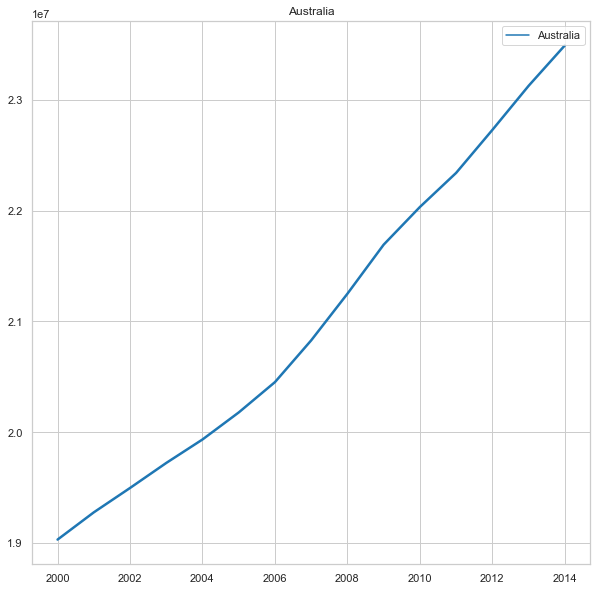

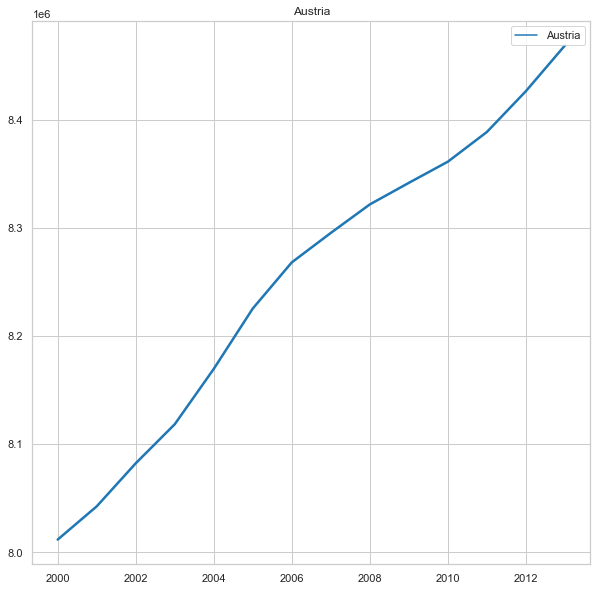

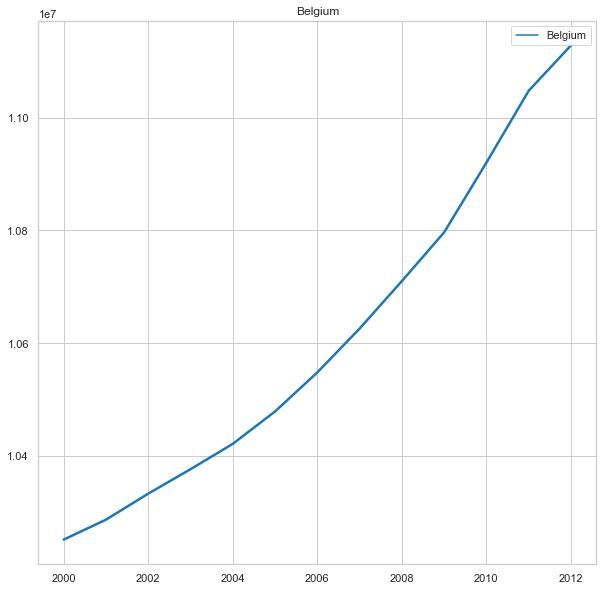

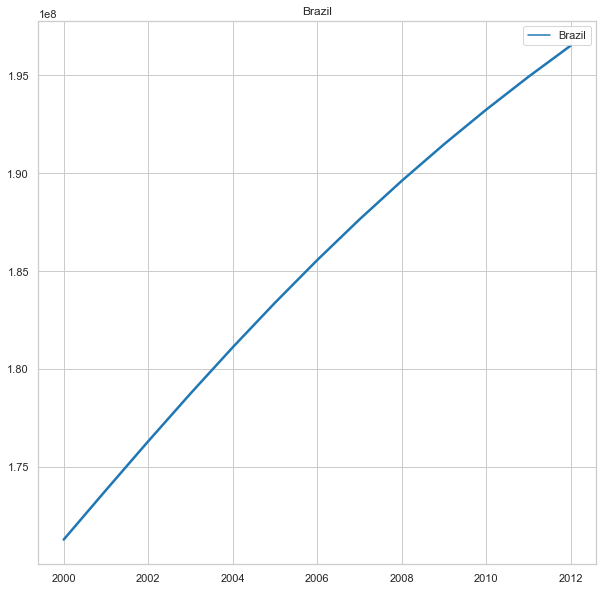

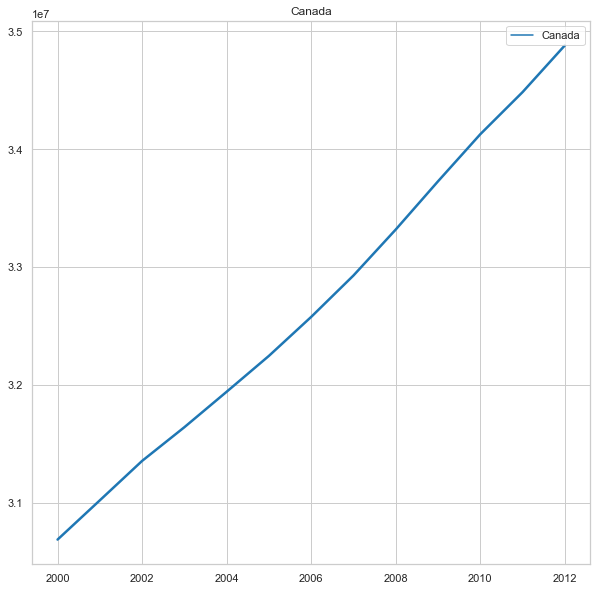

...

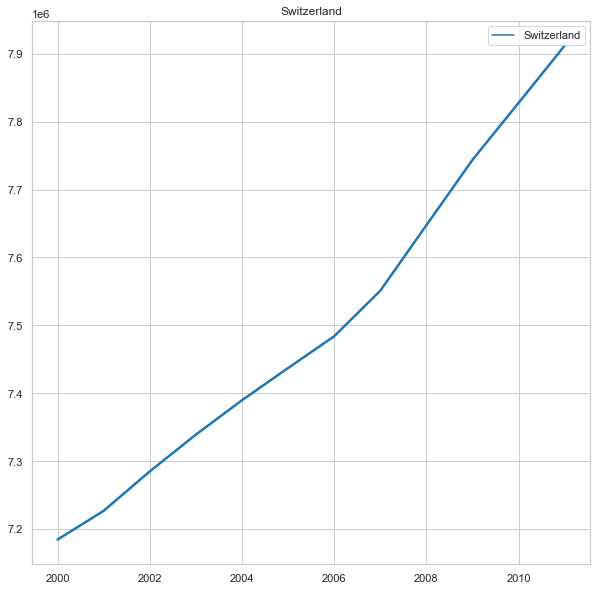

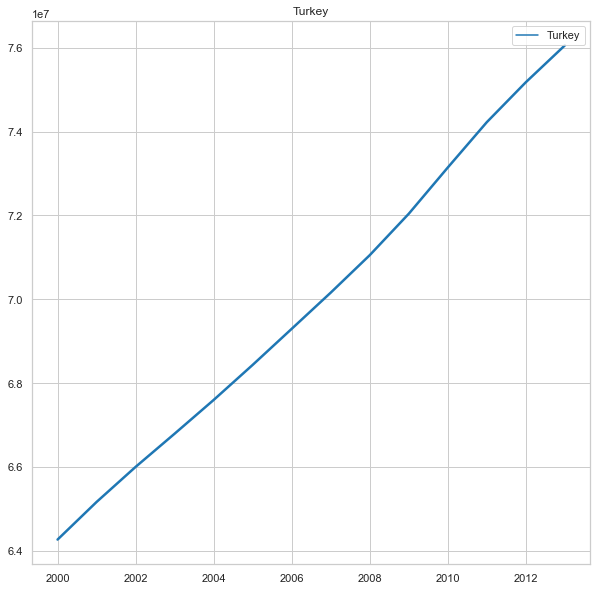

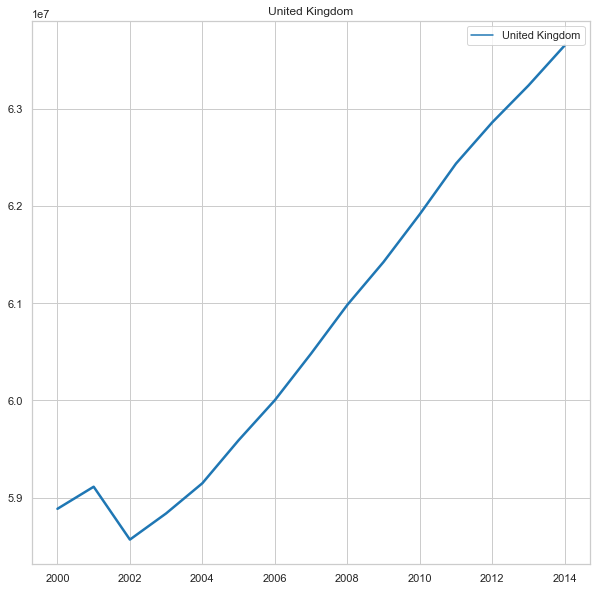

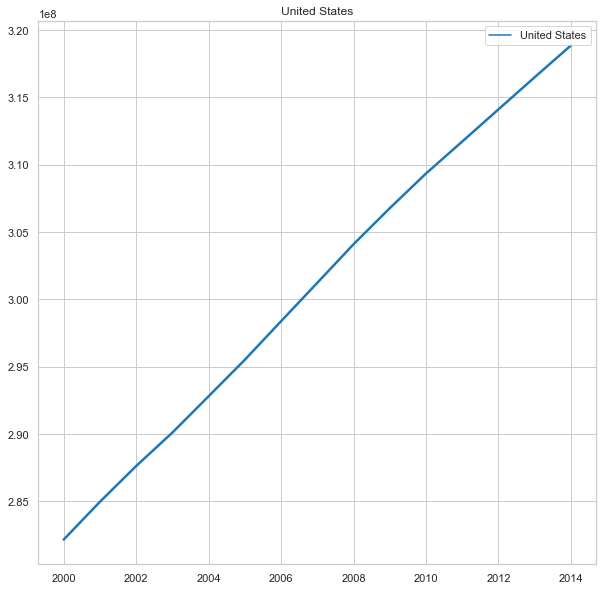

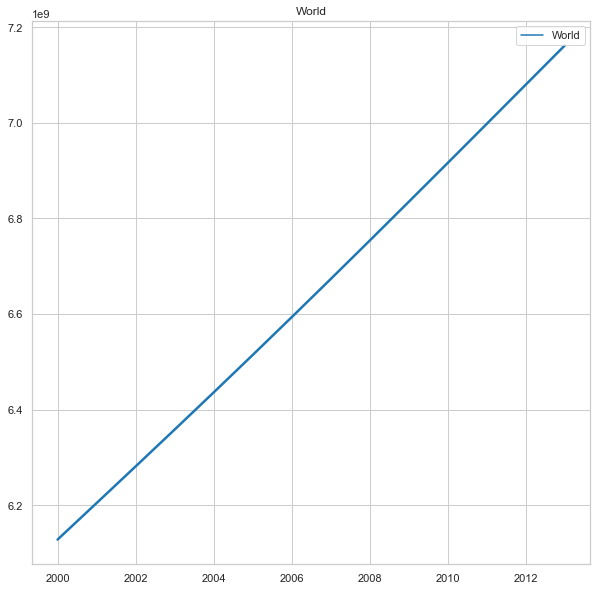

In [12]:
lines(countries_df_all_person)

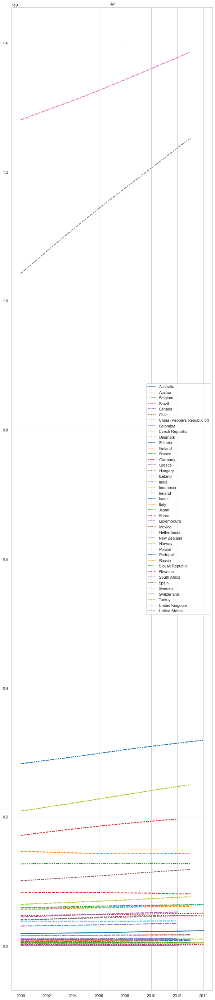

In [13]:
total_lines(countries_df_all_person)

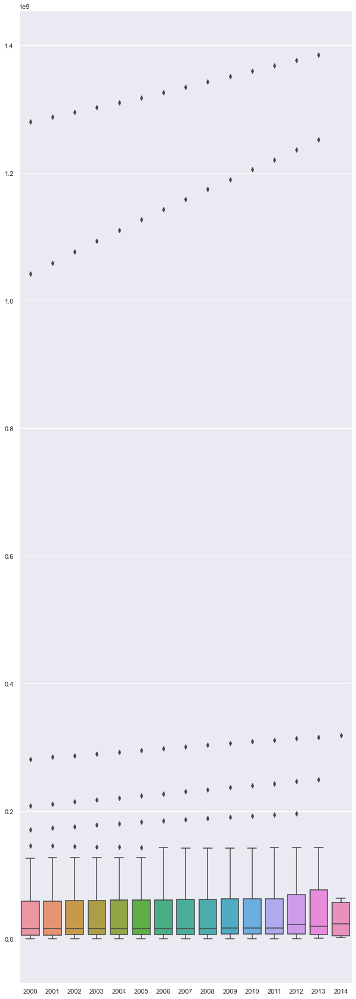

In [14]:
boxplot(countries_df_all_person)

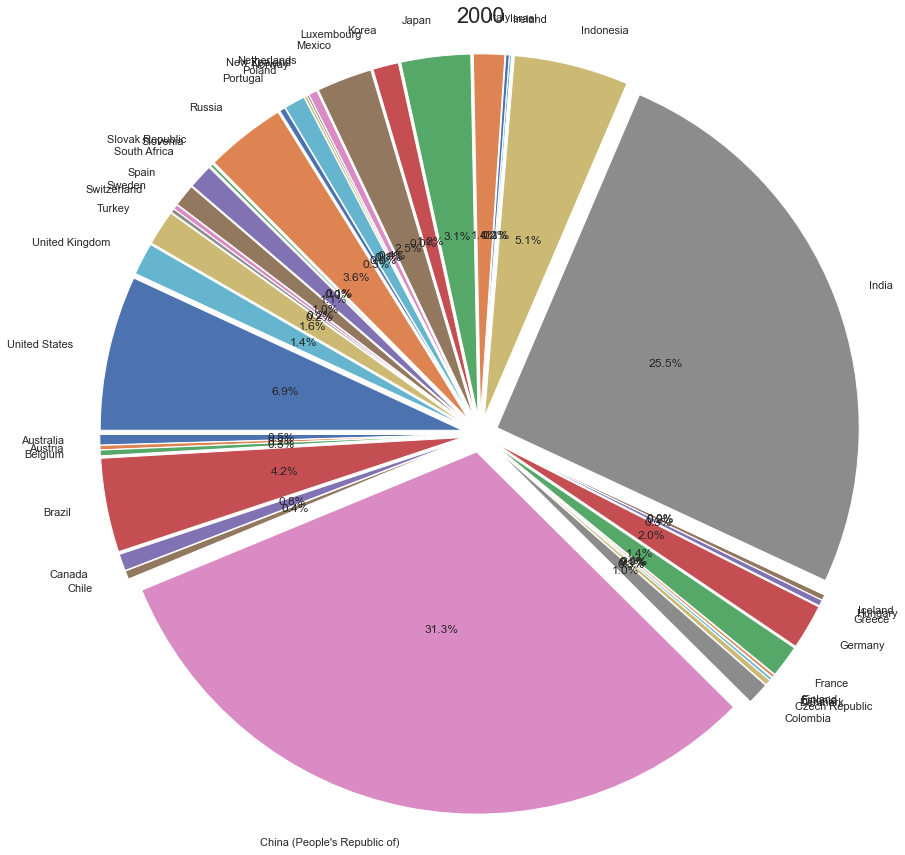

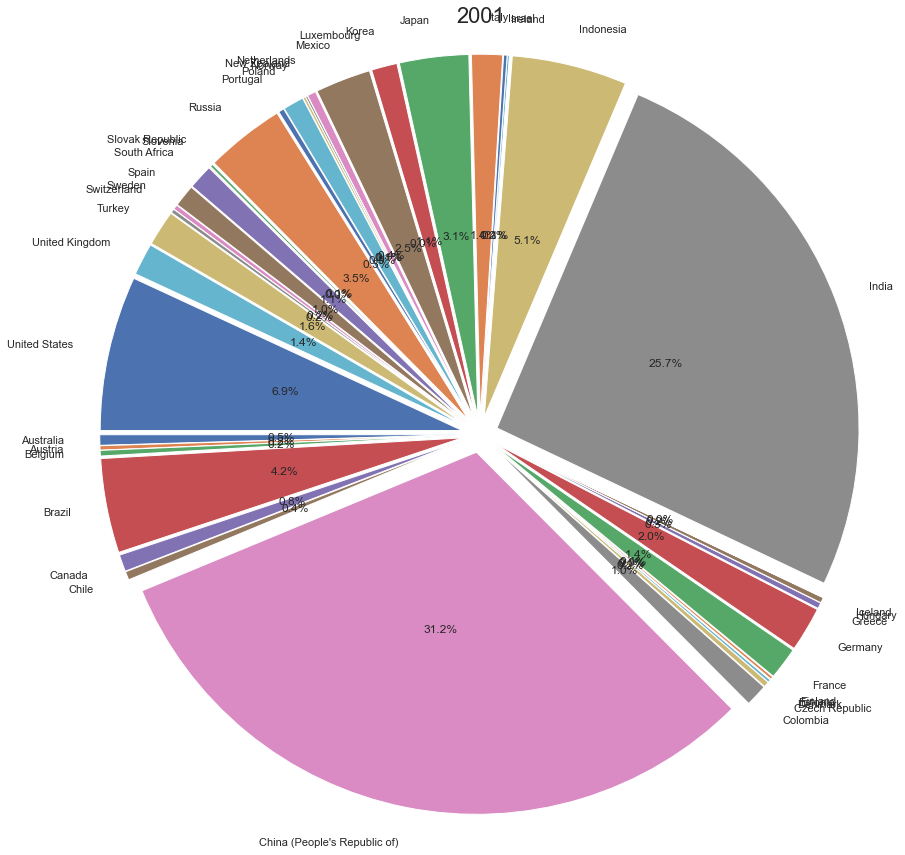

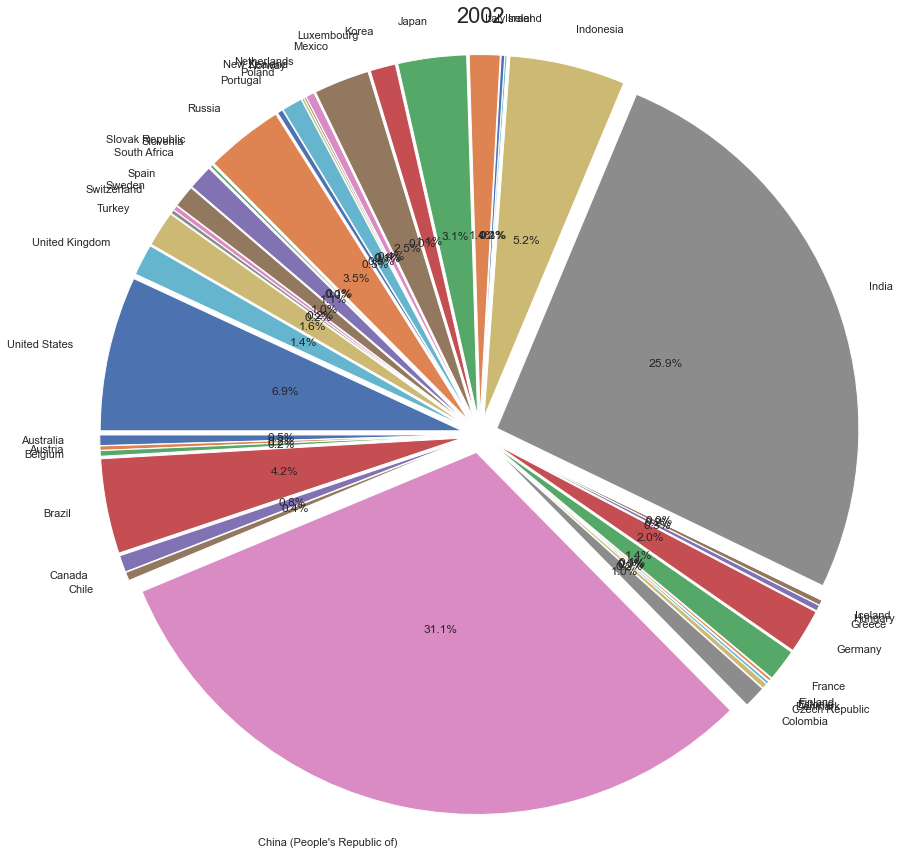

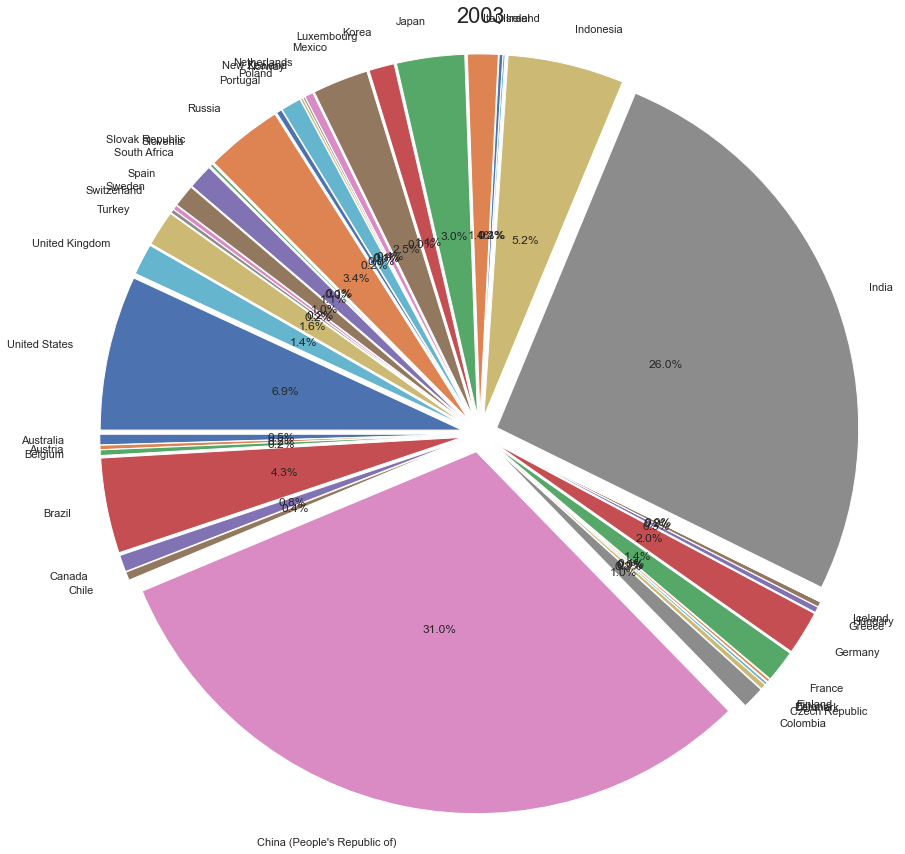

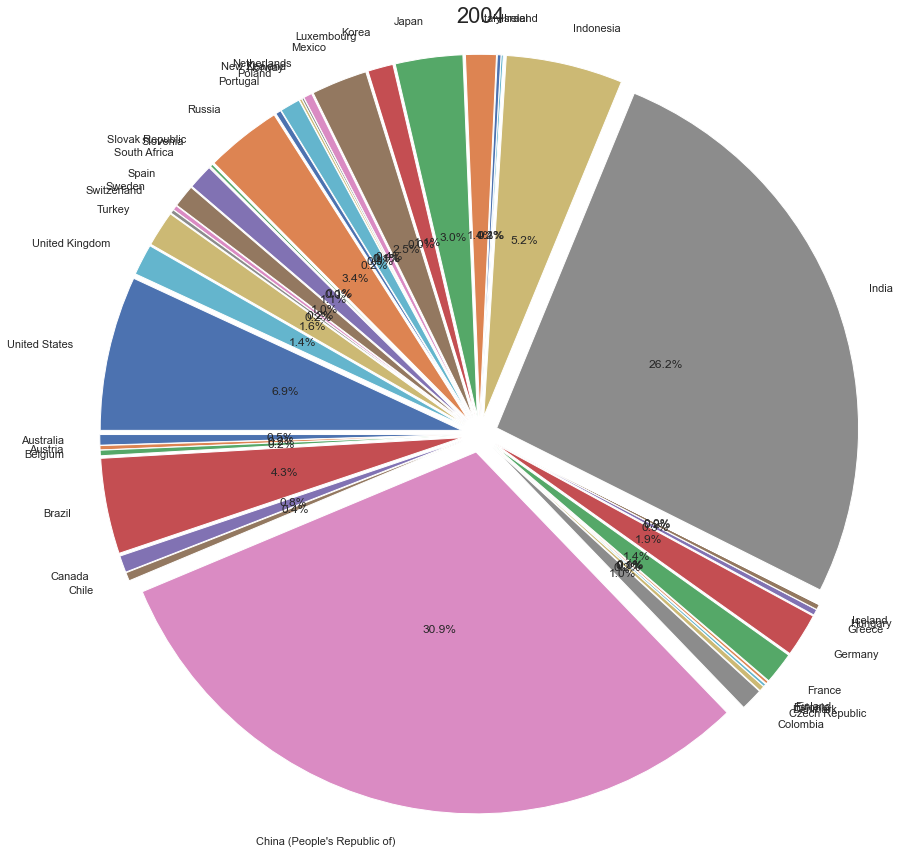

...

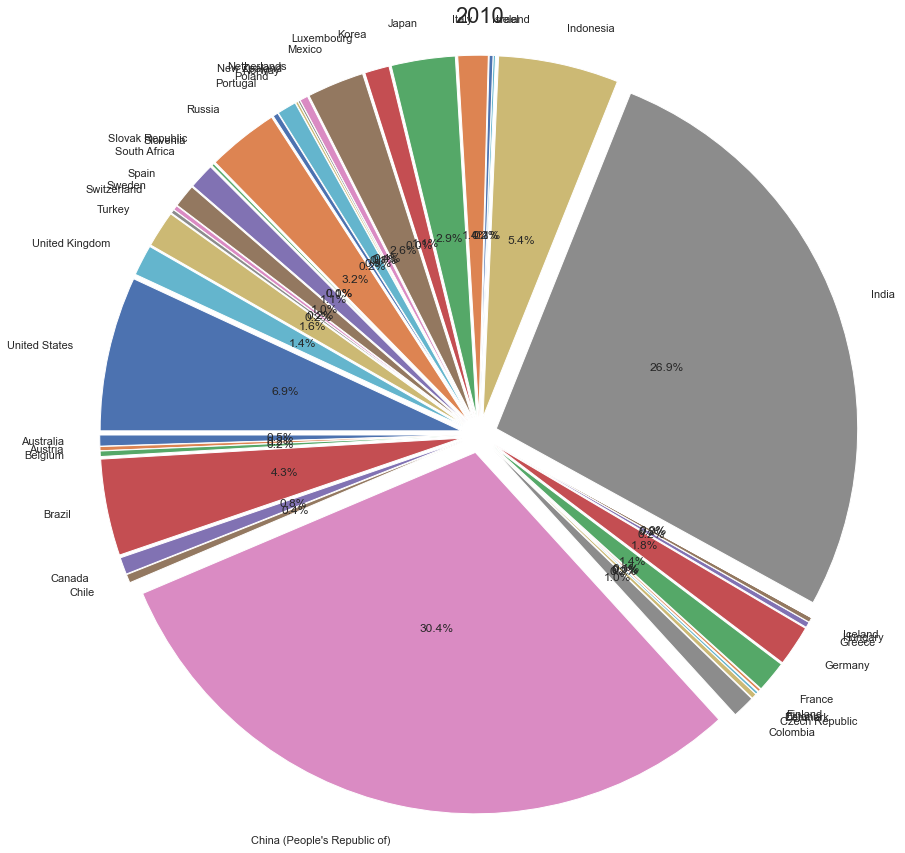

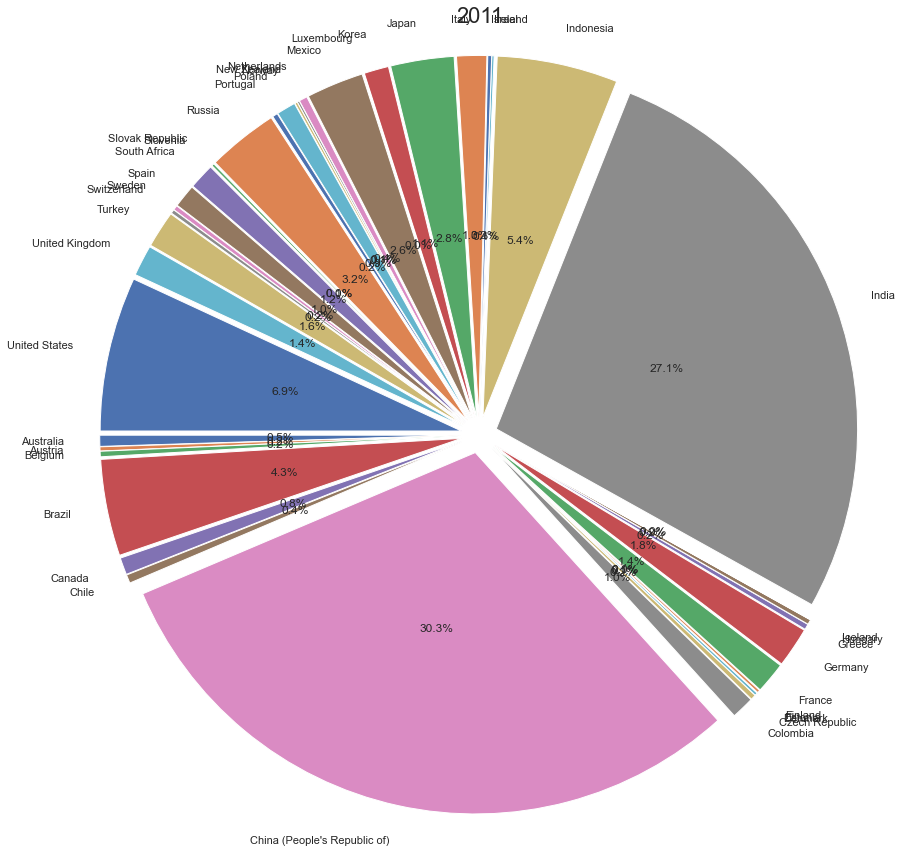

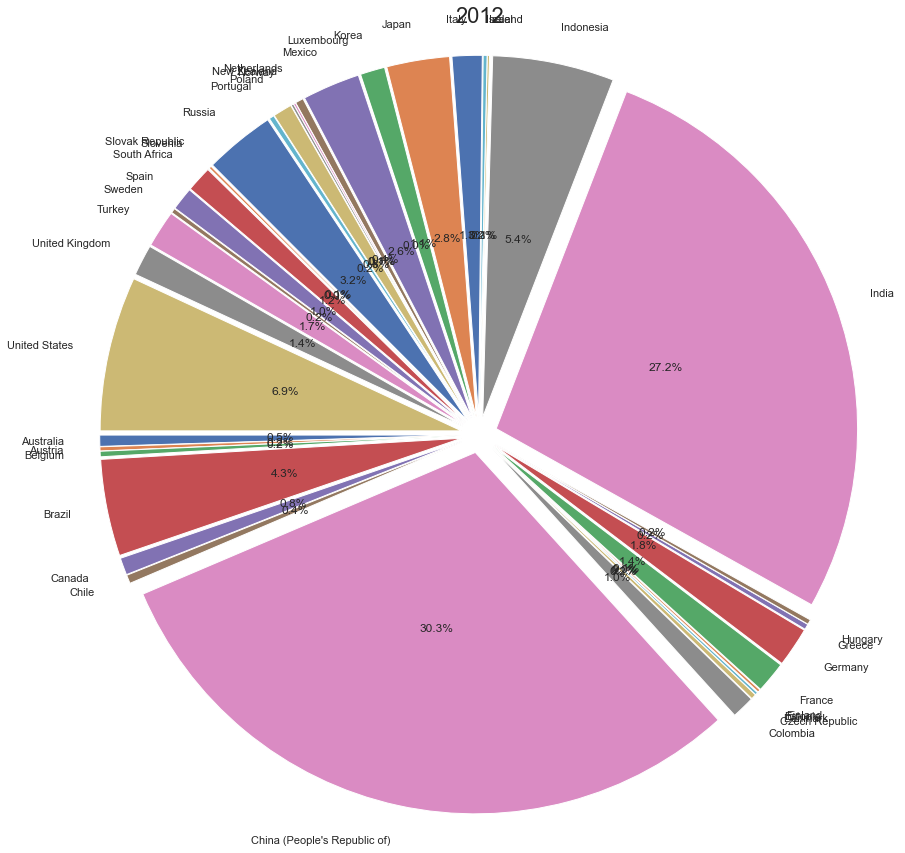

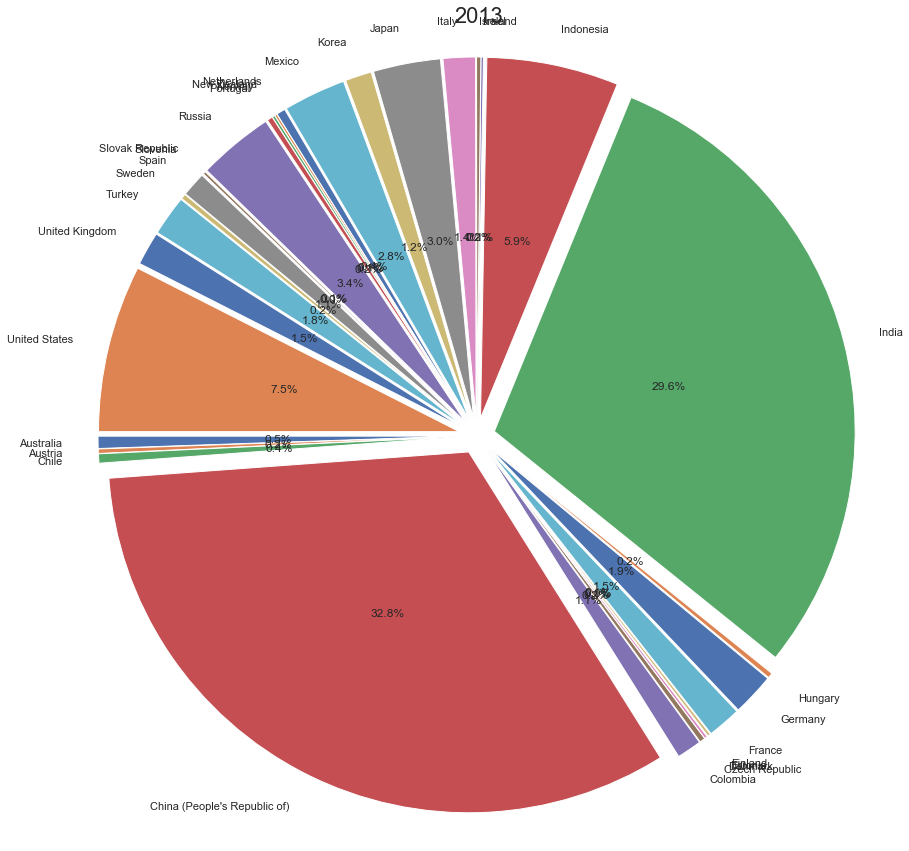

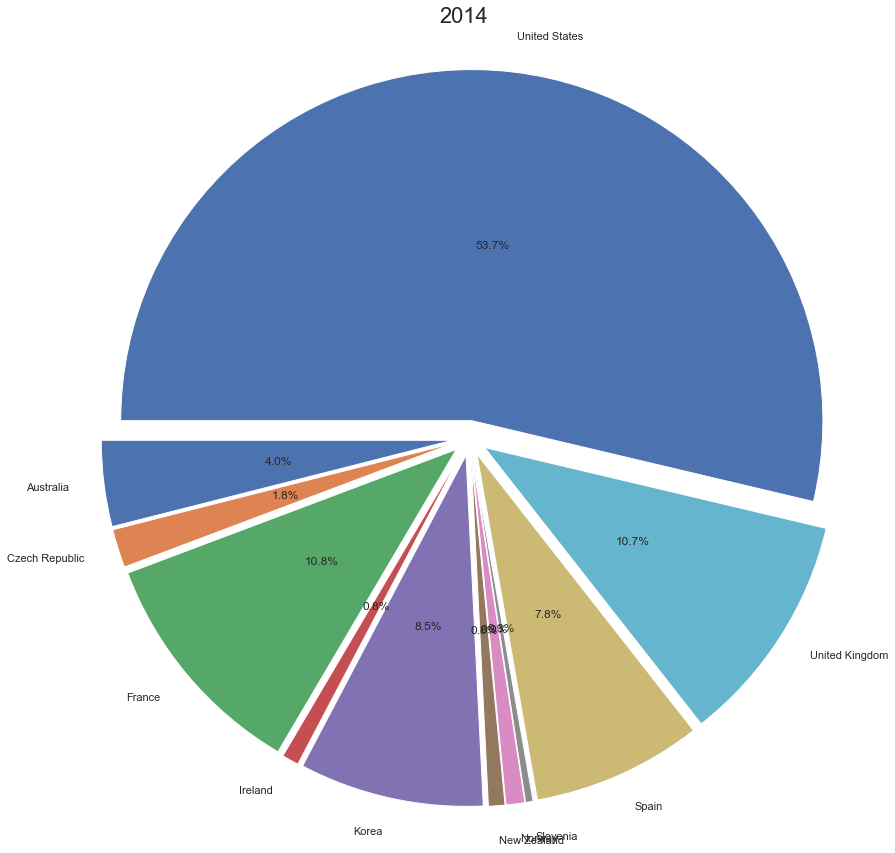

In [15]:
pie(countries_df_all_person)

# Только мужчины

In [16]:
countries_df_males = pd.DataFrame(index=sorted(dt['Time'].unique()), columns=sorted(dt['Country'].unique()))
df1 = dt[dt['Subject'] == 'Population (hist5) All ages']
df1 = df1[df1['Sex'] == 'Males']
for j in countries_df_males.columns:
    df2 = df1[df1['Country'] == j].sort_values("Time")
    df2.index = df2['Time']
    countries_df_males[j] = df2['Value']
    # print()

countries_df_males

,Australia,Austria,Belgium,Brazil,Canada,Chile,China (People's Republic of),Colombia,Czech Republic,Denmark,...,Slovak Republic,Slovenia,South Africa,Spain,Sweden,Switzerland,Turkey,United Kingdom,United States,World
2000,9443000.0,3874717.0,5012016.0,84350720.0,15193960.0,7620300.0,NaN,19883770.0,4999326.0,2639221.0,...,2618819.0,972581.0,21977450.0,19868640.0,4386435.0,3510203.0,32163420.0,28690000.0,138443400.0,NaN
2001,9562000.0,3893919.0,5030153.0,85562800.0,15365610.0,7706752.0,NaN,20139880.0,4978951.0,2649233.0,...,2612216.0,973711.0,22277840.0,19973040.0,4400599.0,3529342.0,32621200.0,28832000.0,139891500.0,NaN
2002,9675000.0,3918940.0,5054586.0,86758220.0,15533160.0,7793208.0,NaN,20395340.0,4964598.0,2658285.0,...,2610837.0,976111.0,22580920.0,20326850.0,4417776.0,3559690.0,33046040.0,28614230.0,141230600.0,NaN
2003,9788000.0,3940285.0,5077030.0,87923720.0,15675460.0,7879658.0,NaN,20653560.0,4968189.0,2666279.0,...,2608942.0,977436.0,22886360.0,20738000.0,4436881.0,3588285.0,33447210.0,28759840.0,142428900.0,NaN
2004,9896000.0,3967701.0,5099250.0,89051850.0,15825750.0,7966110.0,NaN,20913570.0,4971730.0,2673714.0,...,2608577.0,977092.0,23192410.0,21093050.0,4456483.0,3615118.0,33853710.0,28924870.0,143828000.0,NaN
2005,10020000.0,3998952.0,5127573.0,90135970.0,15979800.0,8052564.0,NaN,21169840.0,4991439.0,2681569.0,...,2609439.0,980070.0,23497270.0,21541960.0,4476430.0,3640600.0,34276220.0,29154510.0,145197100.0,NaN
2006,10159000.0,4022516.0,5162614.0,91171300.0,16147870.0,8134314.0,NaN,21426950.0,5013040.0,2691254.0,...,2610255.0,985876.0,23802390.0,21900710.0,4505036.0,3665931.0,34710310.0,29369680.0,146647300.0,NaN
2007,10354000.0,4036548.0,5202858.0,92154640.0,16323410.0,8216068.0,NaN,21683070.0,5048101.0,2704664.0,...,2612171.0,995125.0,24107350.0,22362070.0,4543722.0,3703187.0,35145970.0,29624590.0,148064800.0,NaN
2008,10572000.0,4050215.0,5246480.0,93084590.0,16519360.0,8297819.0,NaN,21942360.0,5113332.0,2722343.0,...,2616012.0,996969.0,24405900.0,22756860.0,4583815.0,3756845.0,35631690.0,29889620.0,149490000.0,NaN
2009,10801000.0,4061195.0,5290436.0,93962770.0,16726520.0,8379571.0,NaN,22203710.0,5150509.0,2737653.0,...,2620941.0,1011767.0,24689680.0,22934500.0,4626362.0,3809000.0,36181810.0,30119230.0,150807500.0,NaN


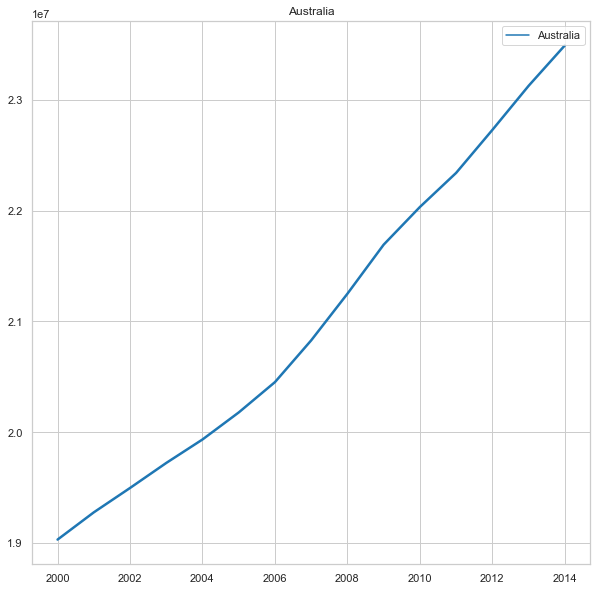

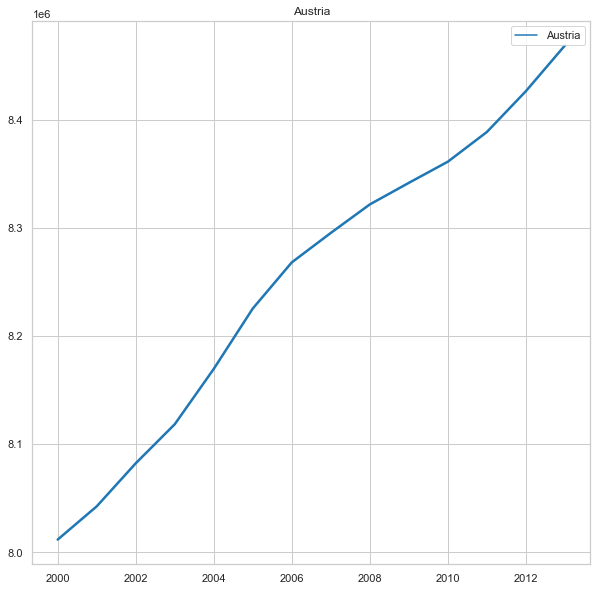

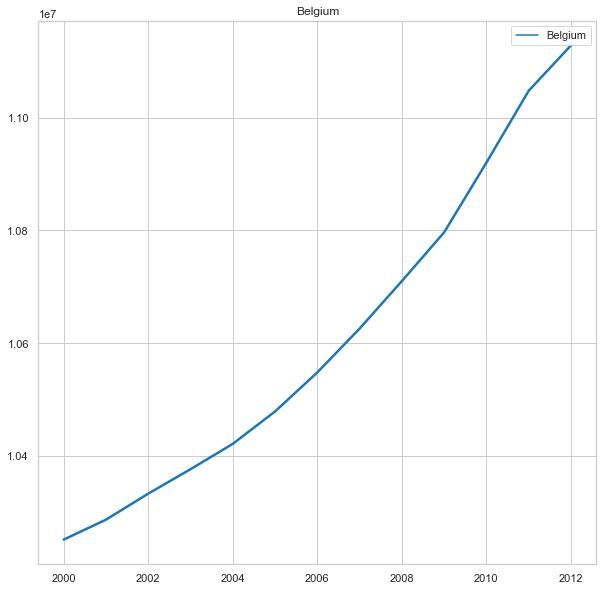

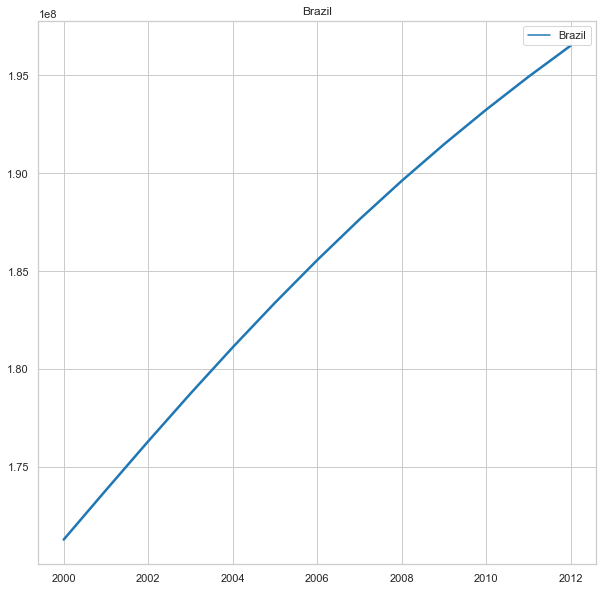

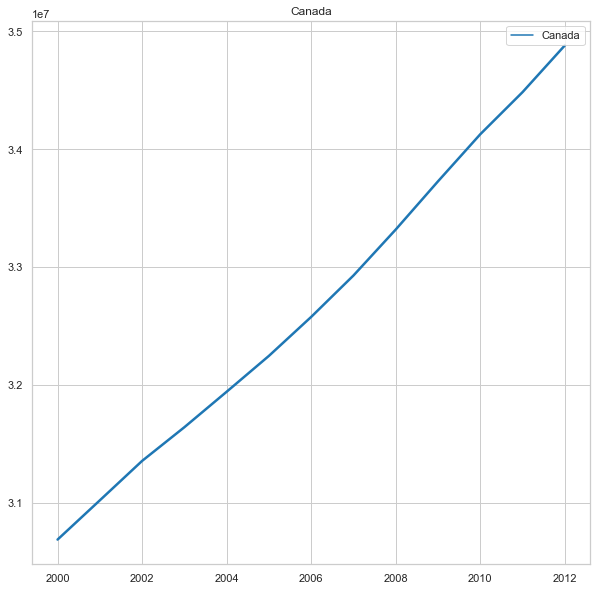

...

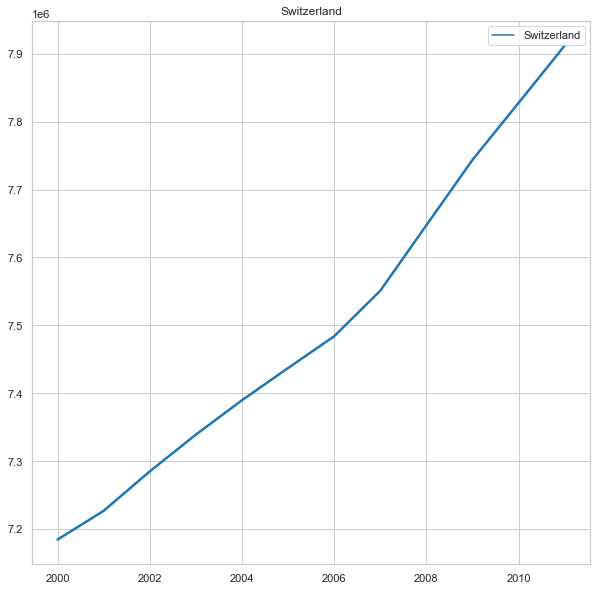

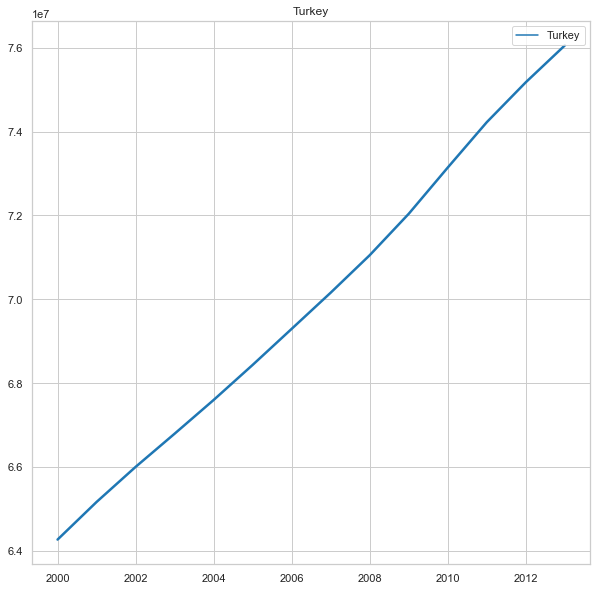

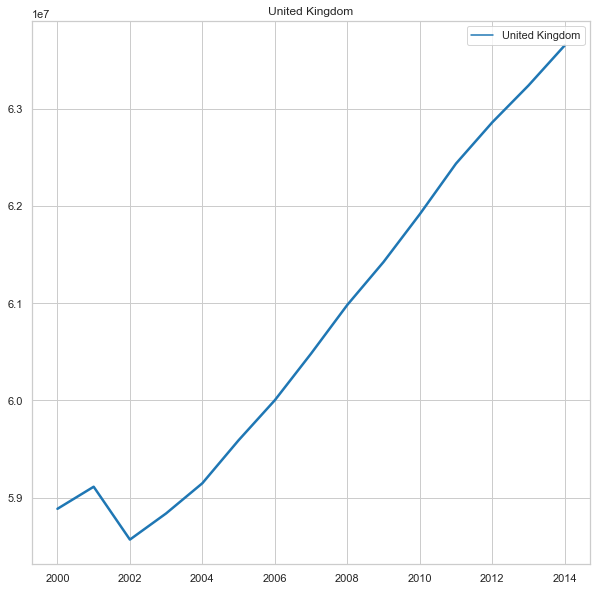

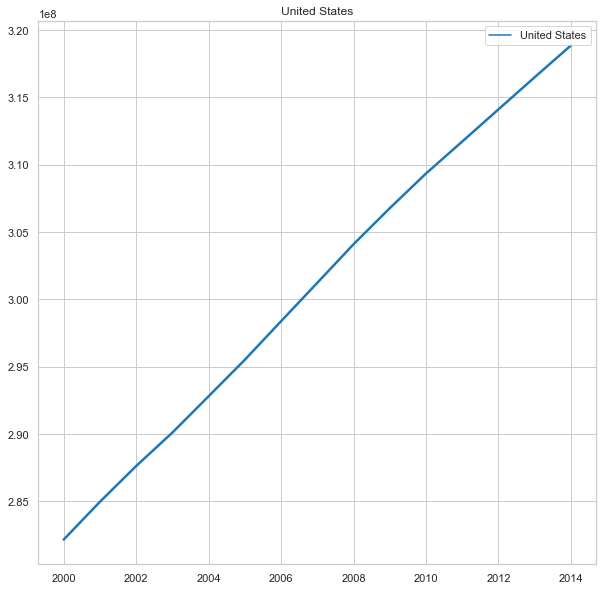

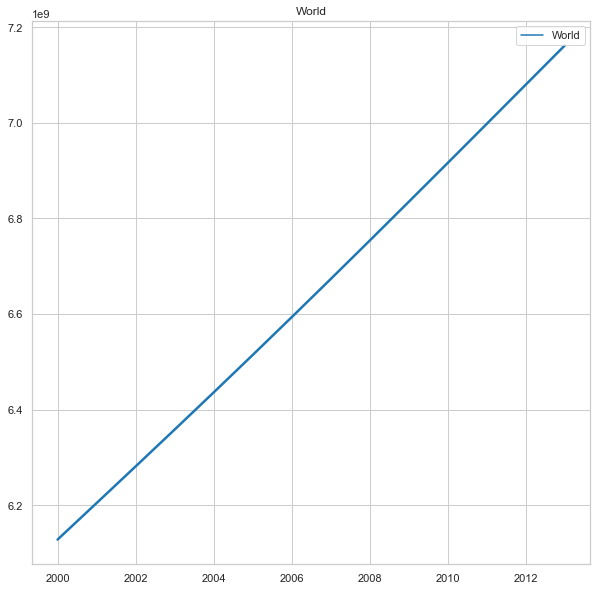

In [17]:
lines(countries_df_all_person)

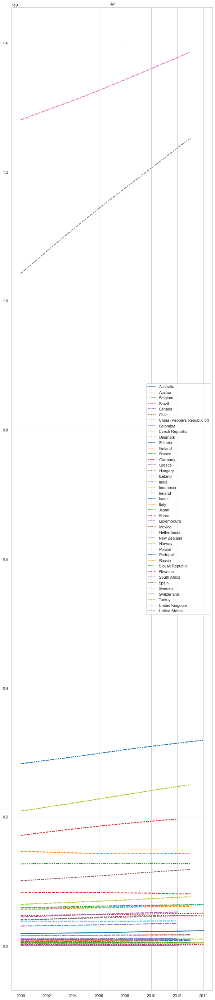

In [18]:
total_lines(countries_df_all_person)

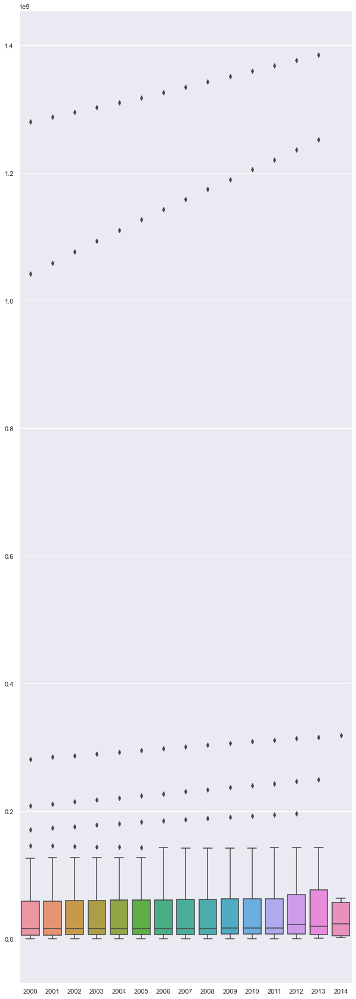

In [19]:
boxplot(countries_df_all_person)

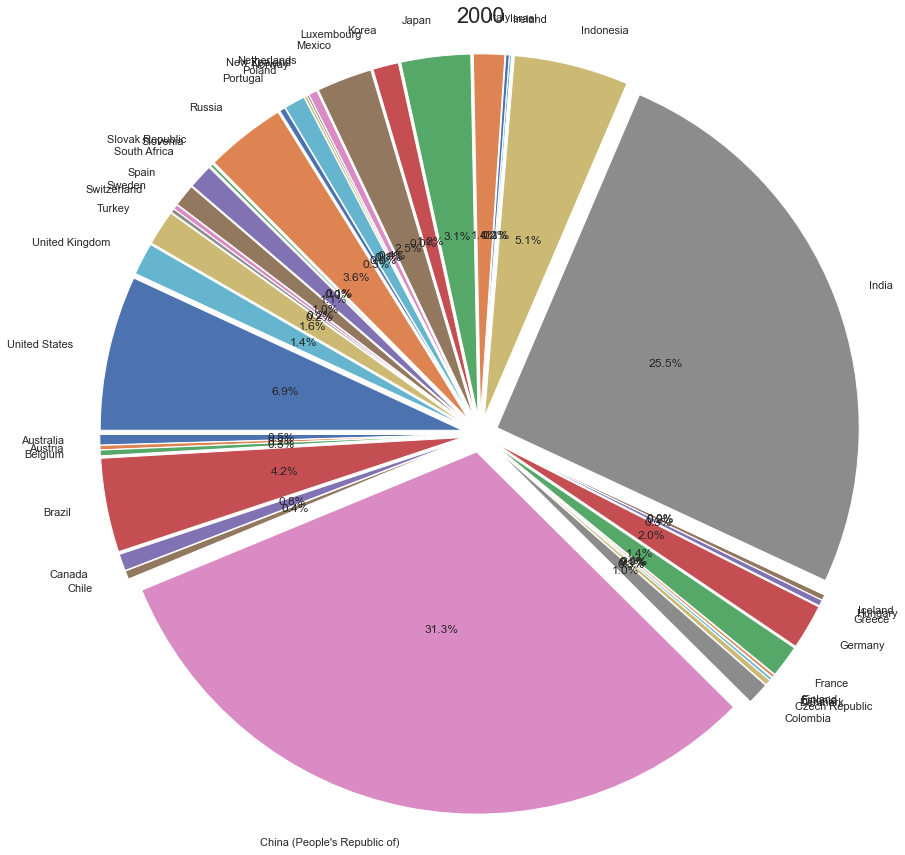

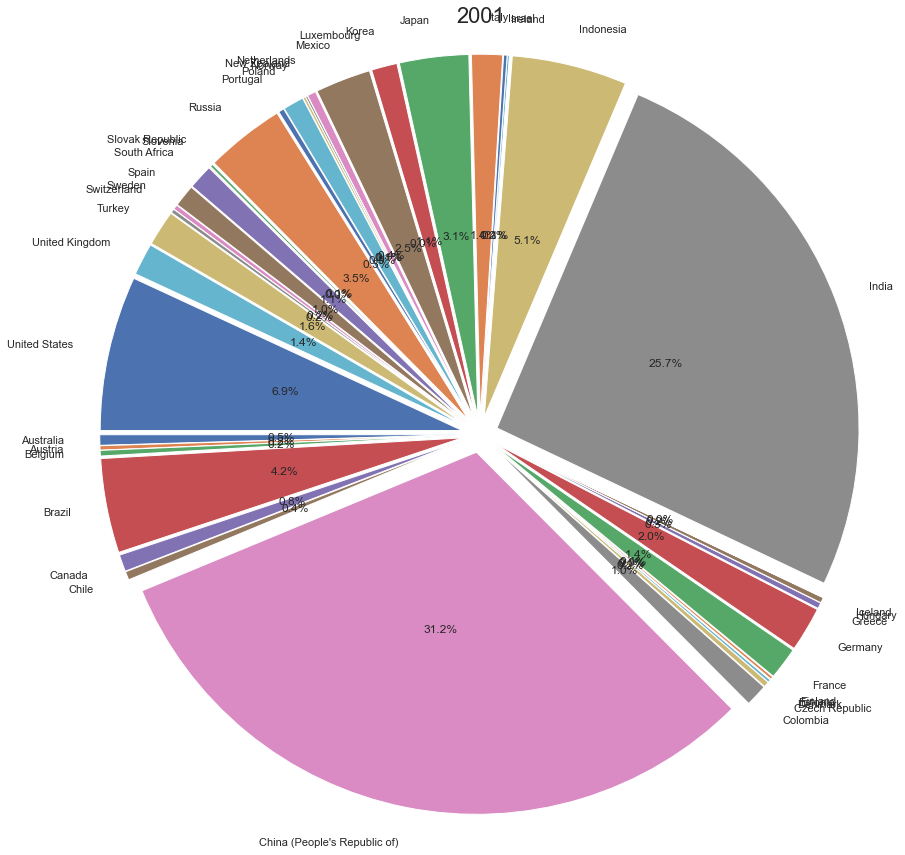

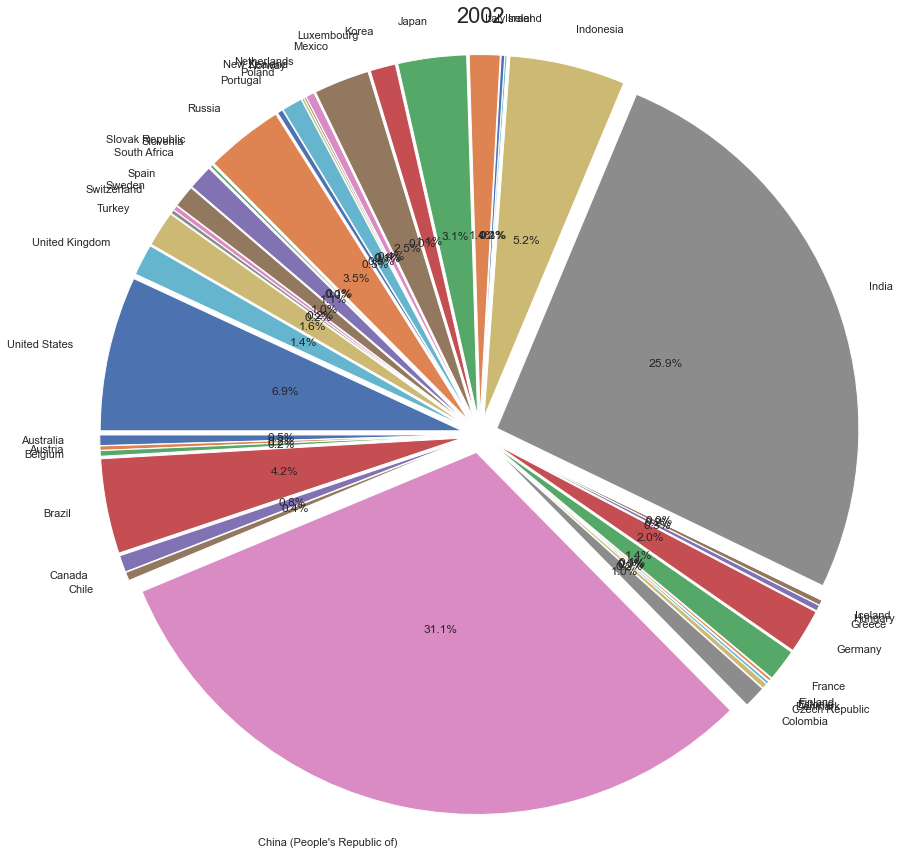

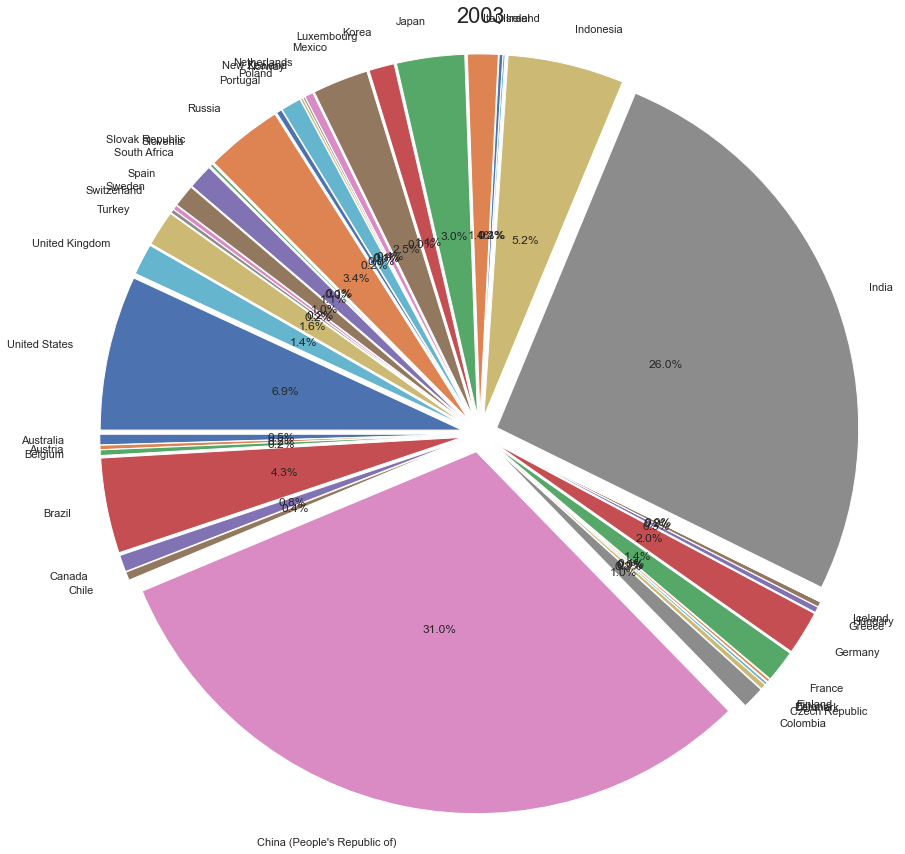

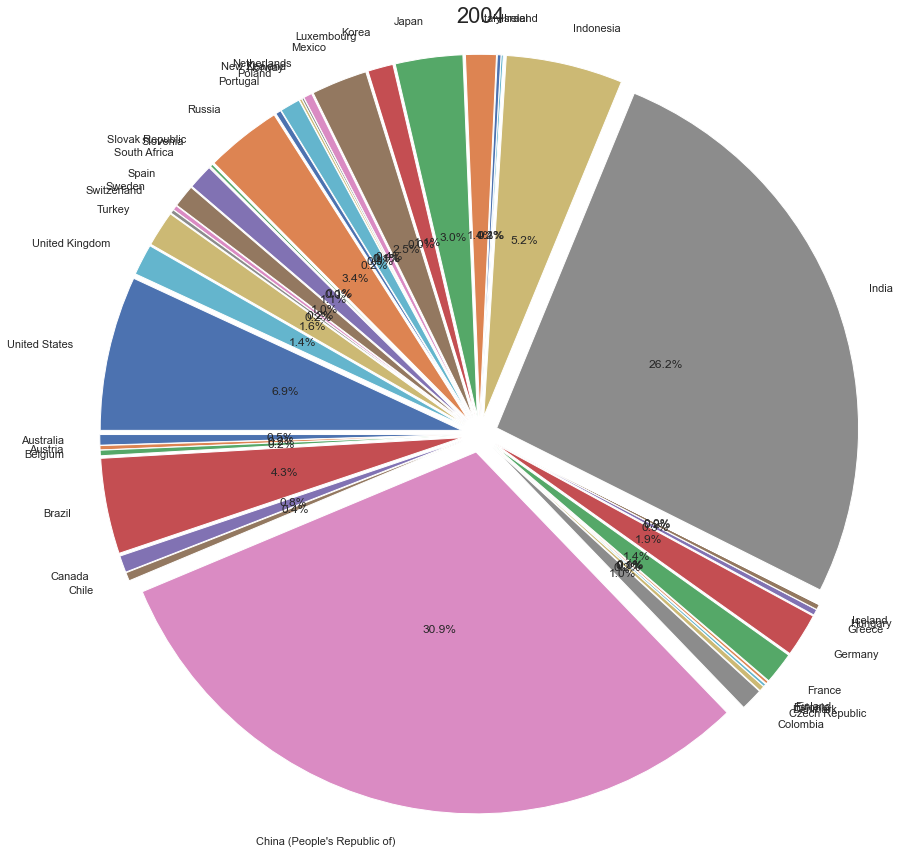

...

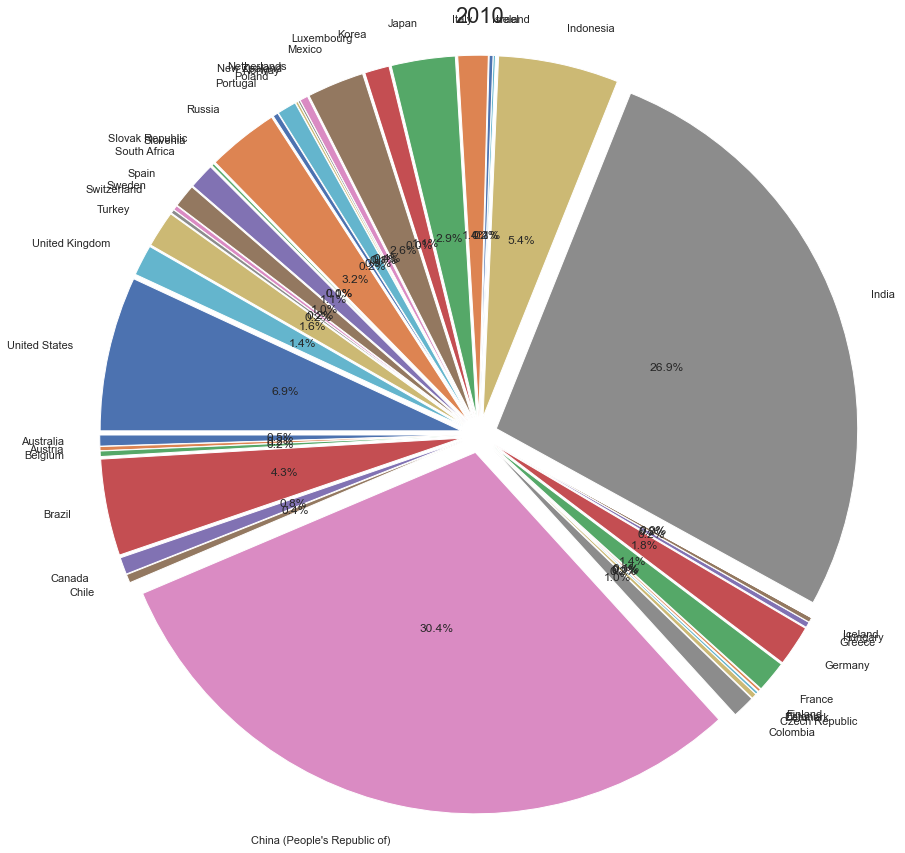

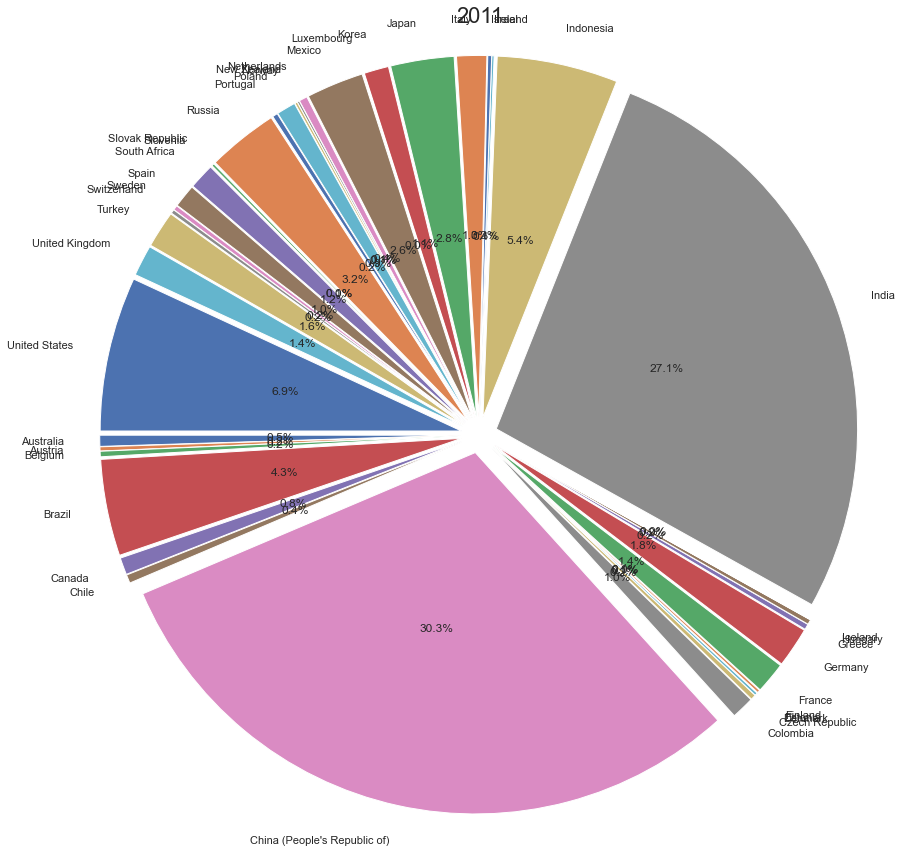

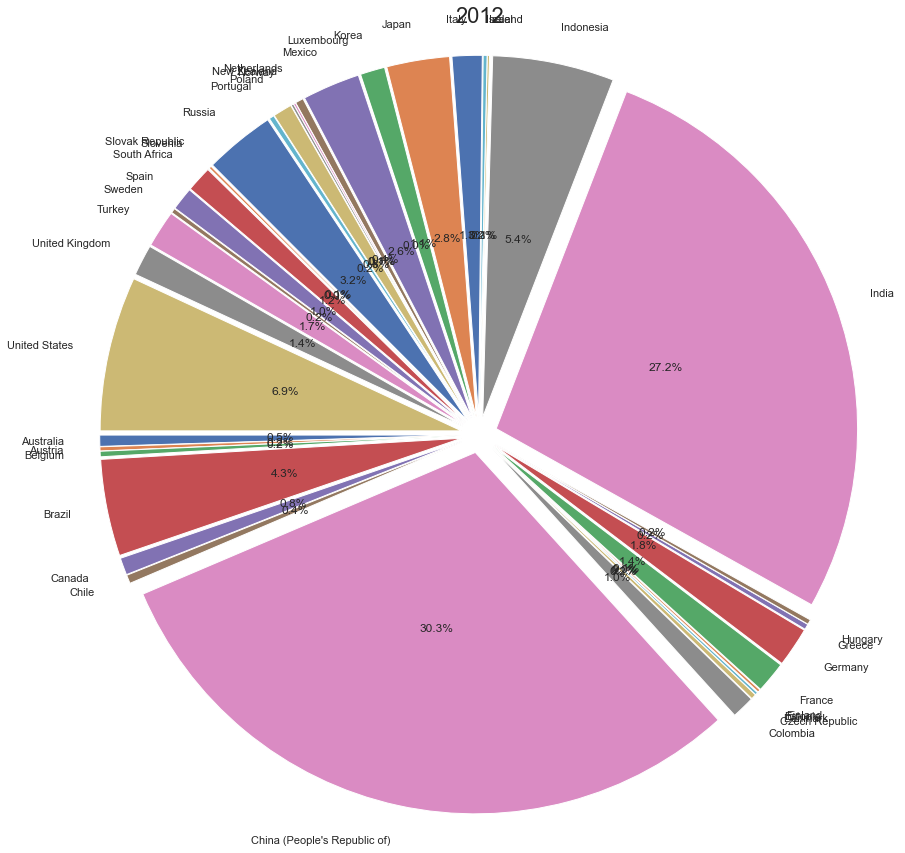

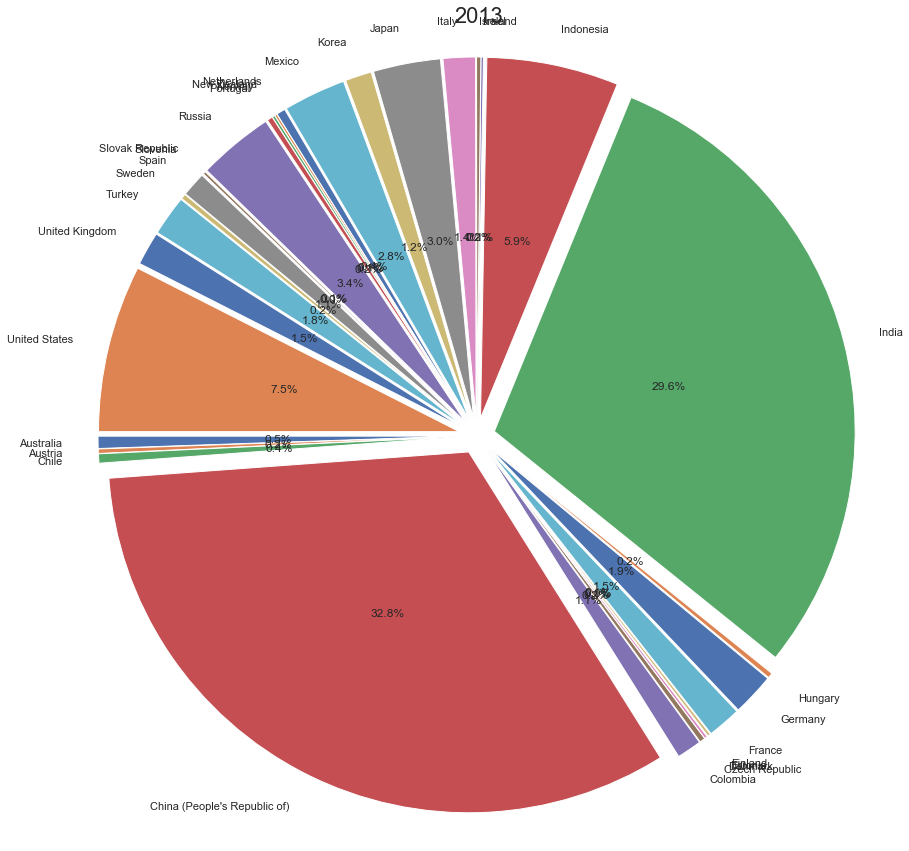

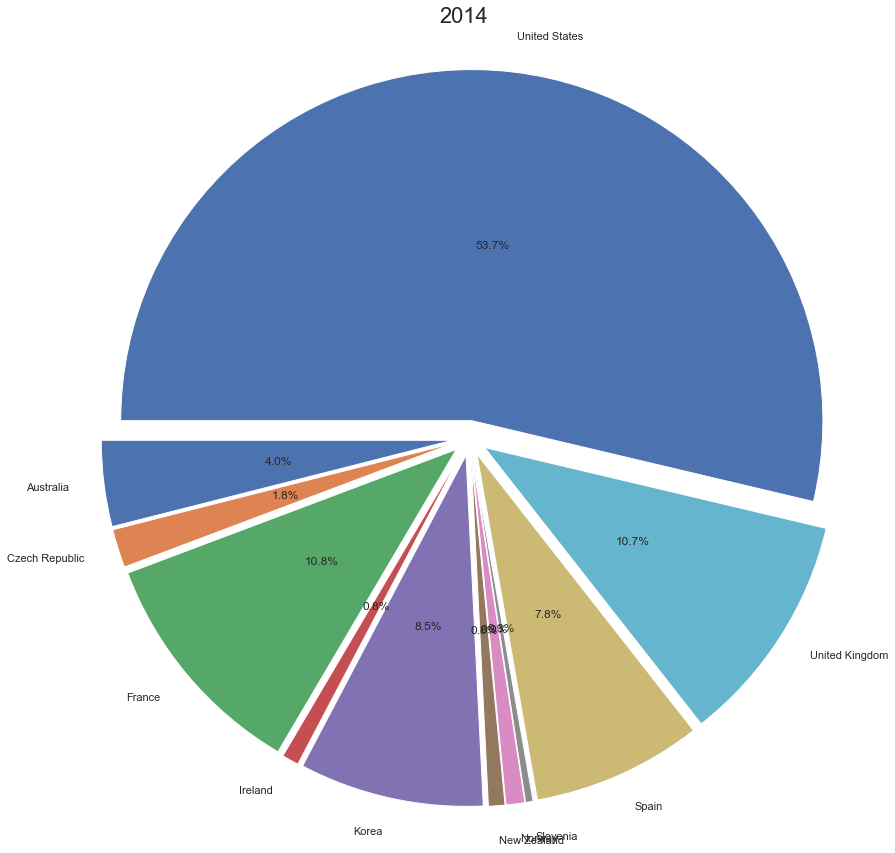

In [20]:
pie(countries_df_all_person)


# Только женщины

In [21]:
countries_df_females = pd.DataFrame(index=sorted(dt['Time'].unique()), columns=sorted(dt['Country'].unique()))
df1 = dt[dt['Subject'] == 'Population (hist5) All ages']
df1 = df1[df1['Sex'] == 'Females']
for j in countries_df_females.columns:
    df2 = df1[df1['Country'] == j].sort_values("Time")
    df2.index = df2['Time']
    countries_df_females[j] = df2['Value']
    # print()

countries_df_females

,Australia,Austria,Belgium,Brazil,Canada,Chile,China (People's Republic of),Colombia,Czech Republic,Denmark,...,Slovak Republic,Slovenia,South Africa,Spain,Sweden,Switzerland,Turkey,United Kingdom,United States,World
2000,9585000.0,4136848.0,5239233.0,86929160.0,15491770.0,7777484.0,NaN,20411790.0,5273177.0,2700396.0,...,2769901.0,1017691.0,22868840.0,20685750.0,4485673.0,3674047.0,32105330.0,30196000.0,143719000.0,NaN
2001,9713000.0,4148374.0,5256416.0,88245210.0,15653410.0,7864927.0,NaN,20673660.0,5245241.0,2709551.0,...,2766650.0,1018324.0,23235380.0,20793010.0,4495361.0,3697305.0,32545130.0,30281000.0,145077500.0,NaN
2002,9820000.0,4163181.0,5278198.0,89545700.0,15820500.0,7952375.0,NaN,20933480.0,5236176.0,2717646.0,...,2766074.0,1019607.0,23606870.0,21096670.0,4507182.0,3725064.0,32956460.0,29955400.0,146394600.0,NaN
2003,9933000.0,4177960.0,5299102.0,90817690.0,15964210.0,8039821.0,NaN,21195400.0,5233462.0,2724295.0,...,2764431.0,1019337.0,23982670.0,21458230.0,4521347.0,3750717.0,33347340.0,30079120.0,147679000.0,NaN
2004,10037000.0,4201740.0,5321886.0,92053750.0,16114920.0,8127268.0,NaN,21454920.0,5235193.0,2730809.0,...,2763702.0,1019912.0,24360610.0,21766120.0,4537047.0,3774508.0,33745030.0,30224240.0,148977300.0,NaN
2005,10157000.0,4226326.0,5351044.0,93247250.0,16265410.0,8214714.0,NaN,21718760.0,5242653.0,2737863.0,...,2763367.0,1021044.0,24738020.0,22120650.0,4553141.0,3796516.0,34159160.0,30436520.0,150319500.0,NaN
2006,10292000.0,4245432.0,5385343.0,94392920.0,16428200.0,8298360.0,NaN,21979000.0,5253606.0,2746018.0,...,2762799.0,1022640.0,25116970.0,22459810.0,4575468.0,3818004.0,34584940.0,30632890.0,151732600.0,NaN
2007,10474000.0,4258641.0,5422841.0,95487080.0,16604110.0,8382006.0,NaN,22243860.0,5274588.0,2756774.0,...,2762450.0,1024281.0,25495420.0,22873930.0,4604370.0,3847930.0,35012140.0,30857240.0,153166400.0,NaN
2008,10677000.0,4271326.0,5463493.0,96528220.0,16798300.0,8465651.0,NaN,22508790.0,5316360.0,2771278.0,...,2763220.0,1025660.0,25861580.0,23226300.0,4635821.0,3890831.0,35419980.0,31092760.0,154604000.0,NaN
2009,10891000.0,4280288.0,5506056.0,97517860.0,17000390.0,8549302.0,NaN,22775120.0,5340983.0,2785442.0,...,2765464.0,1030568.0,26199860.0,23433050.0,4672152.0,3935000.0,35857390.0,31304490.0,155964100.0,NaN


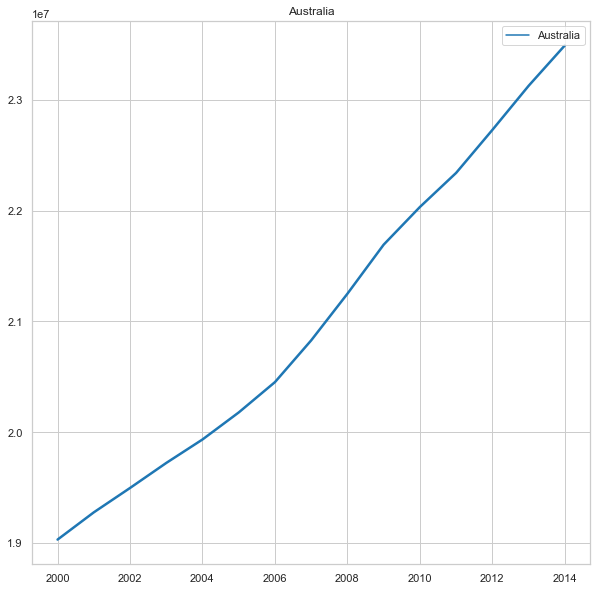

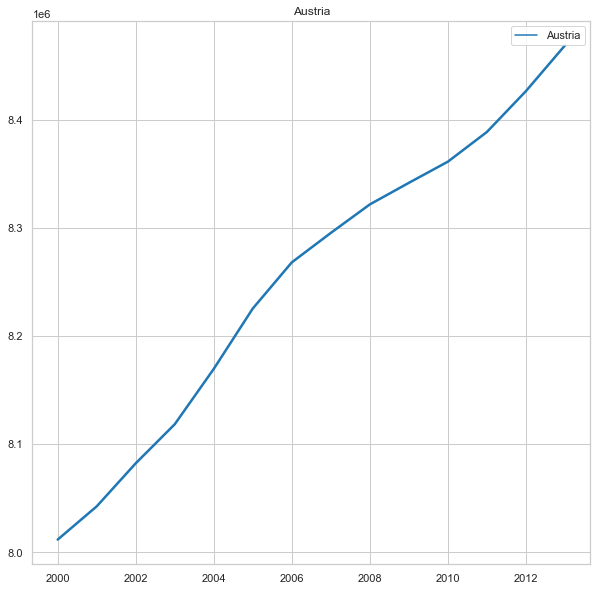

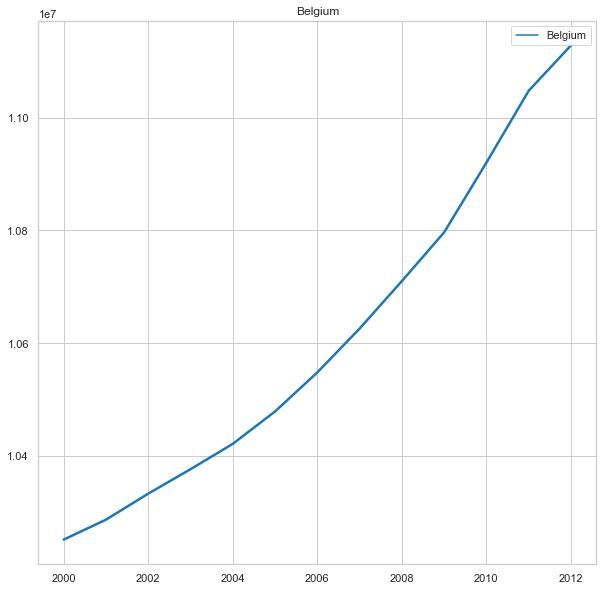

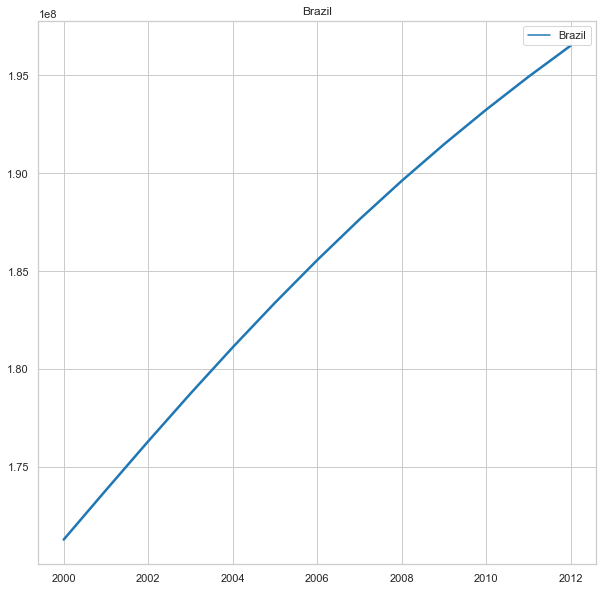

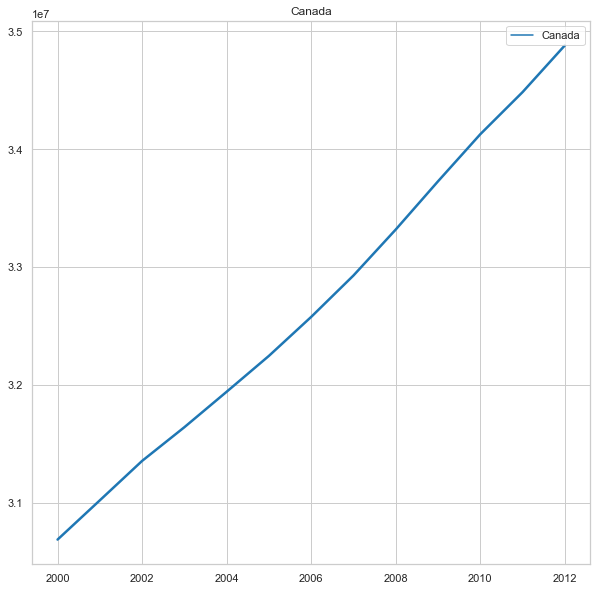

...

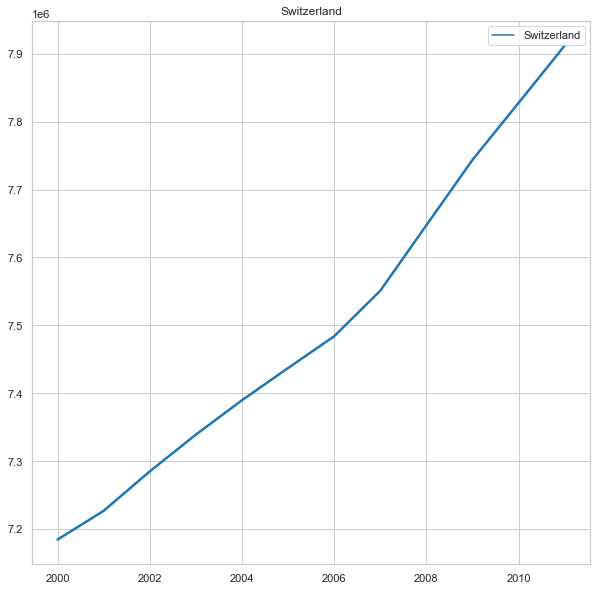

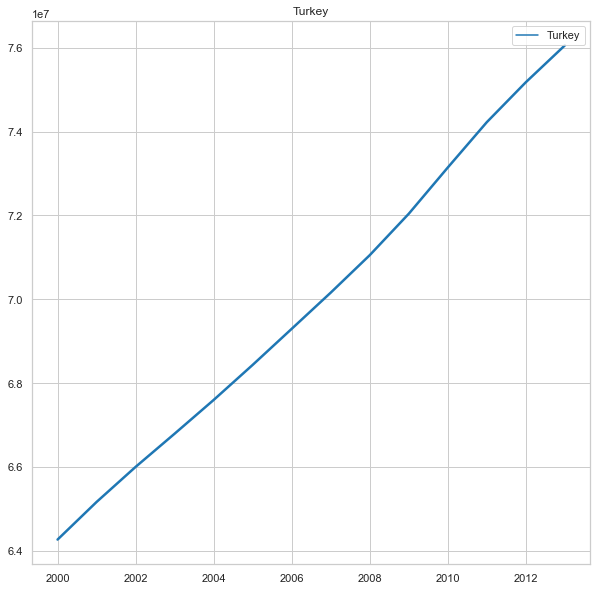

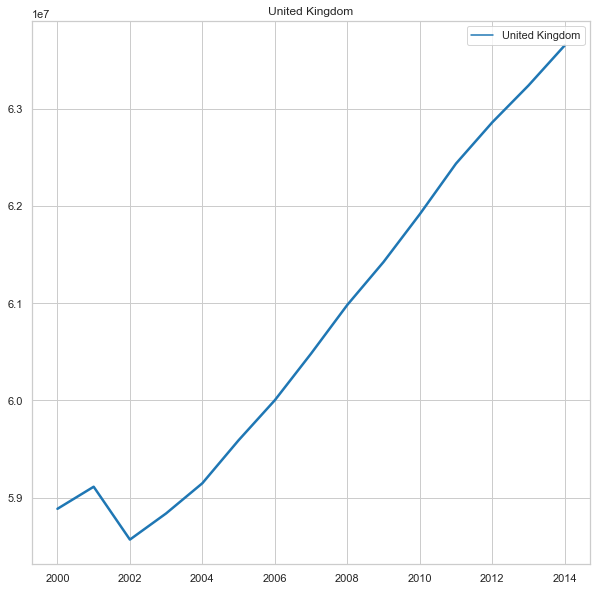

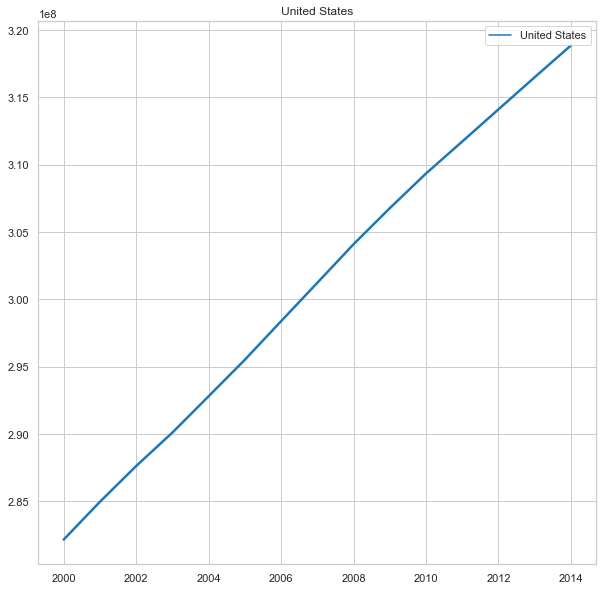

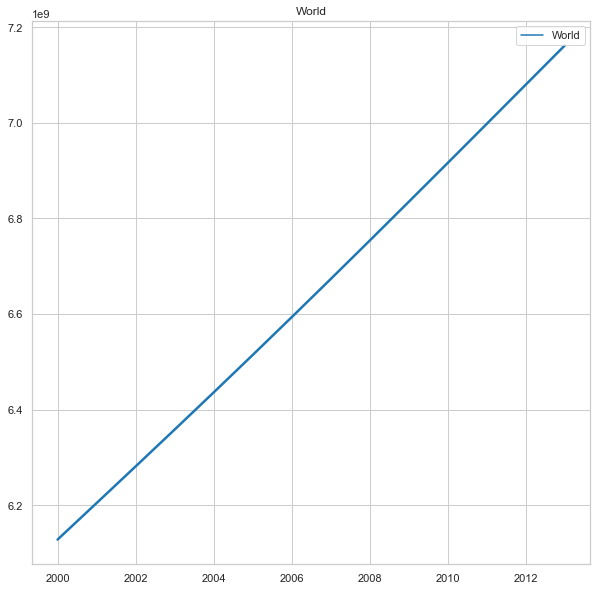

In [22]:
lines(countries_df_all_person)

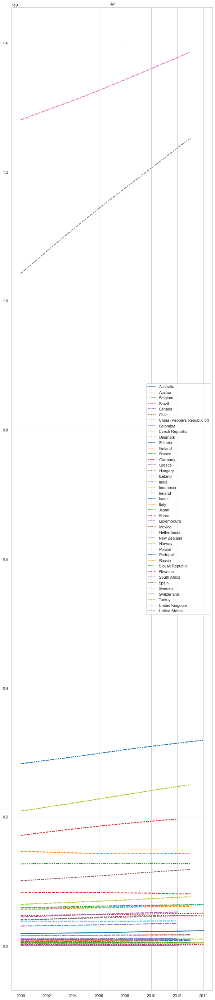

In [23]:
total_lines(countries_df_all_person)

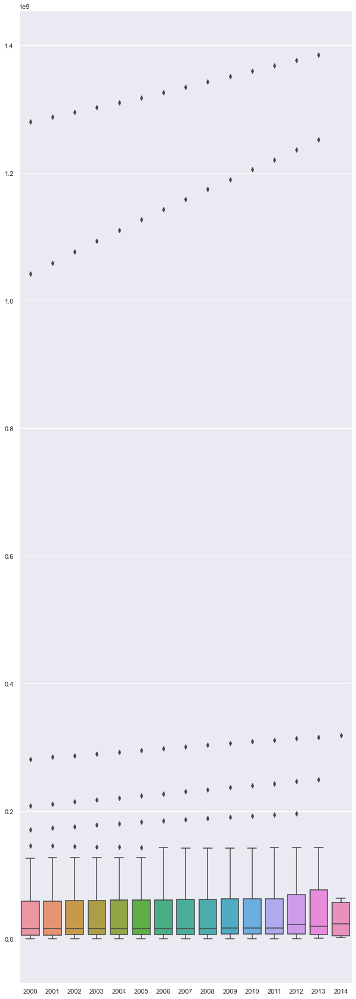

In [24]:
boxplot(countries_df_all_person)

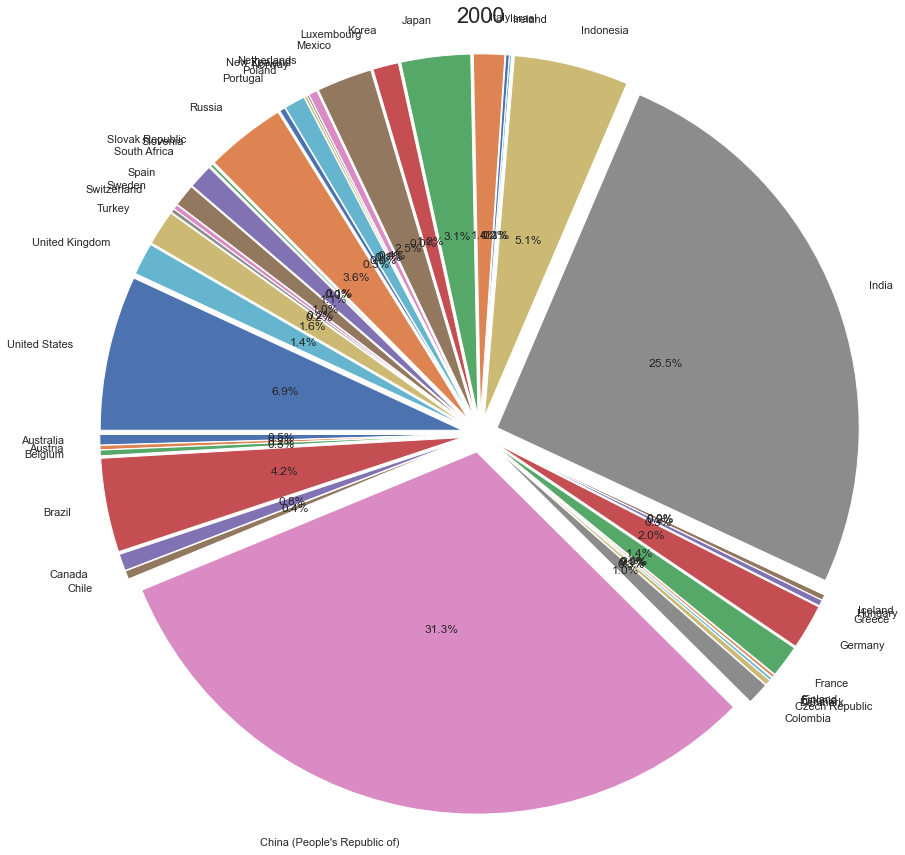

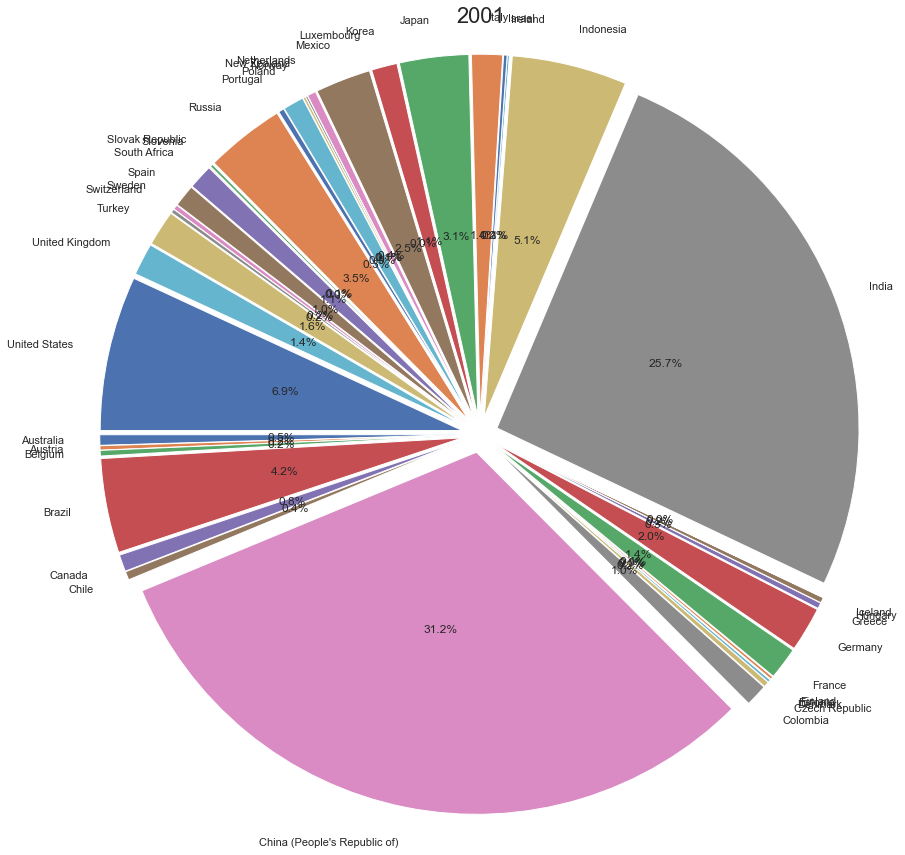

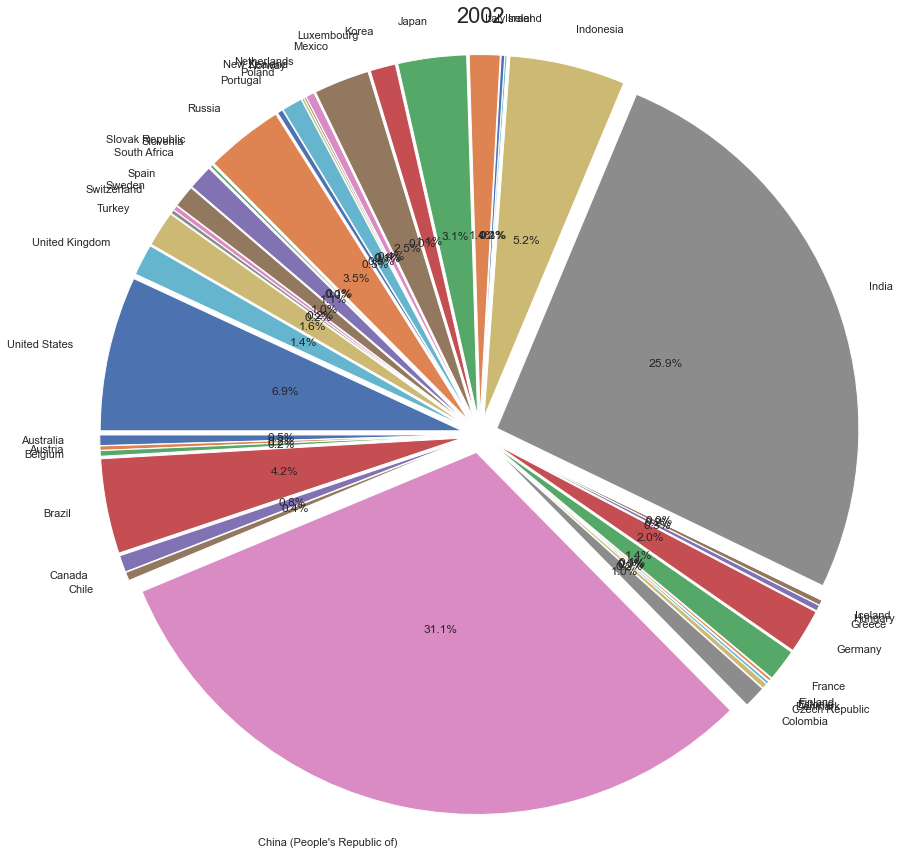

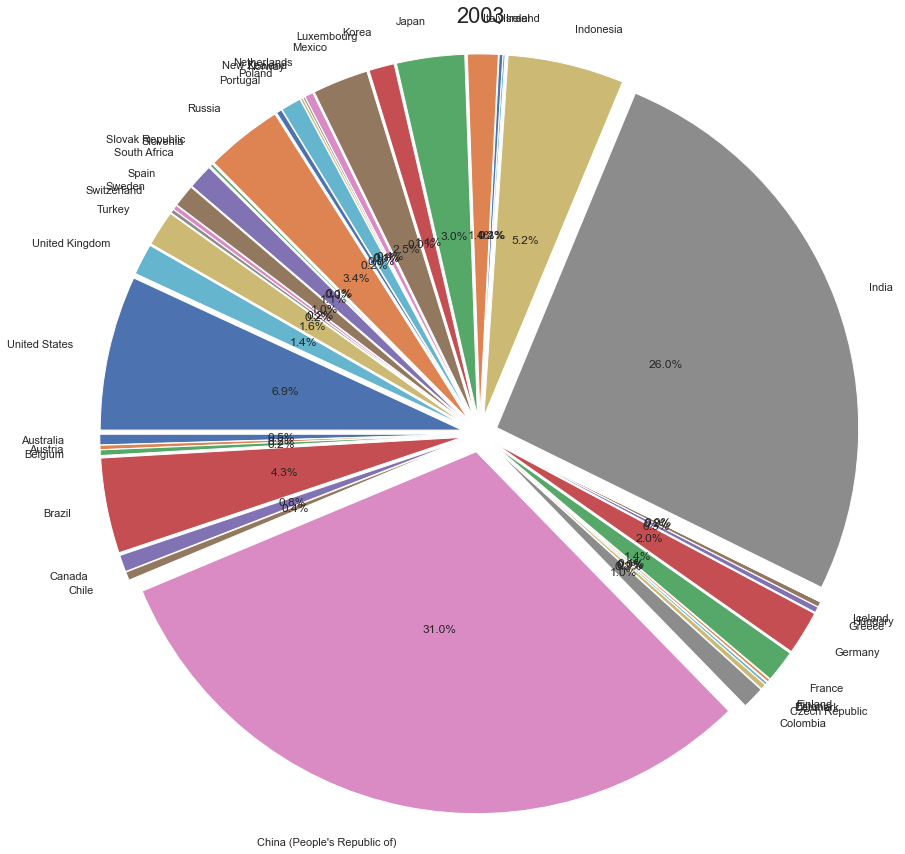

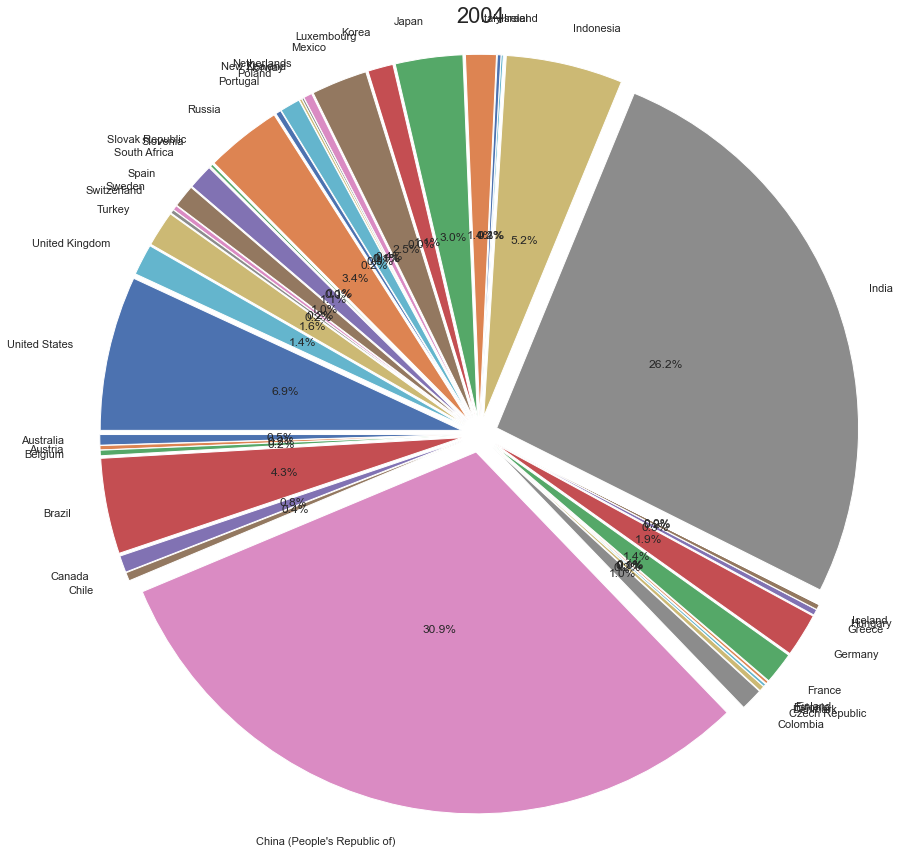

...

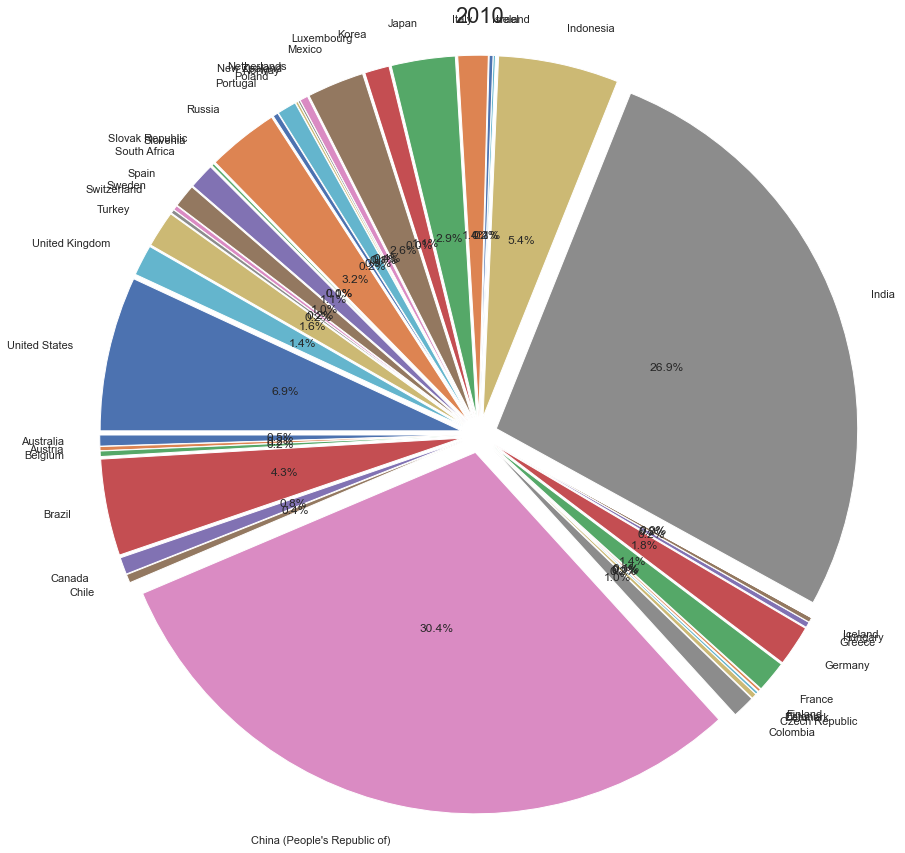

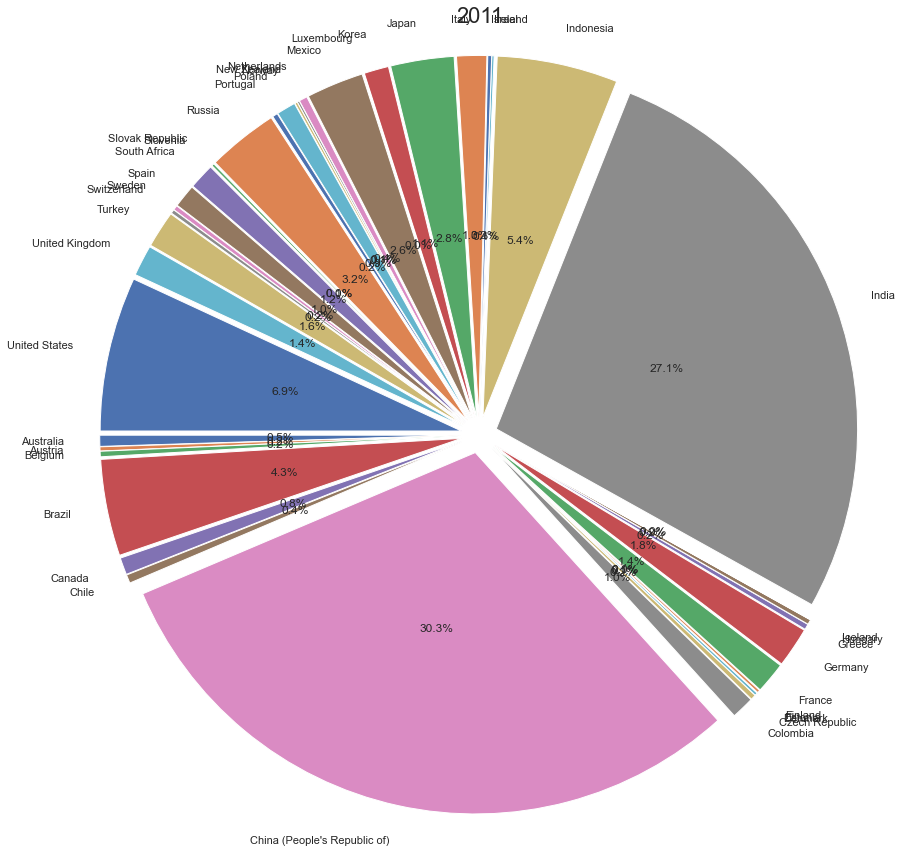

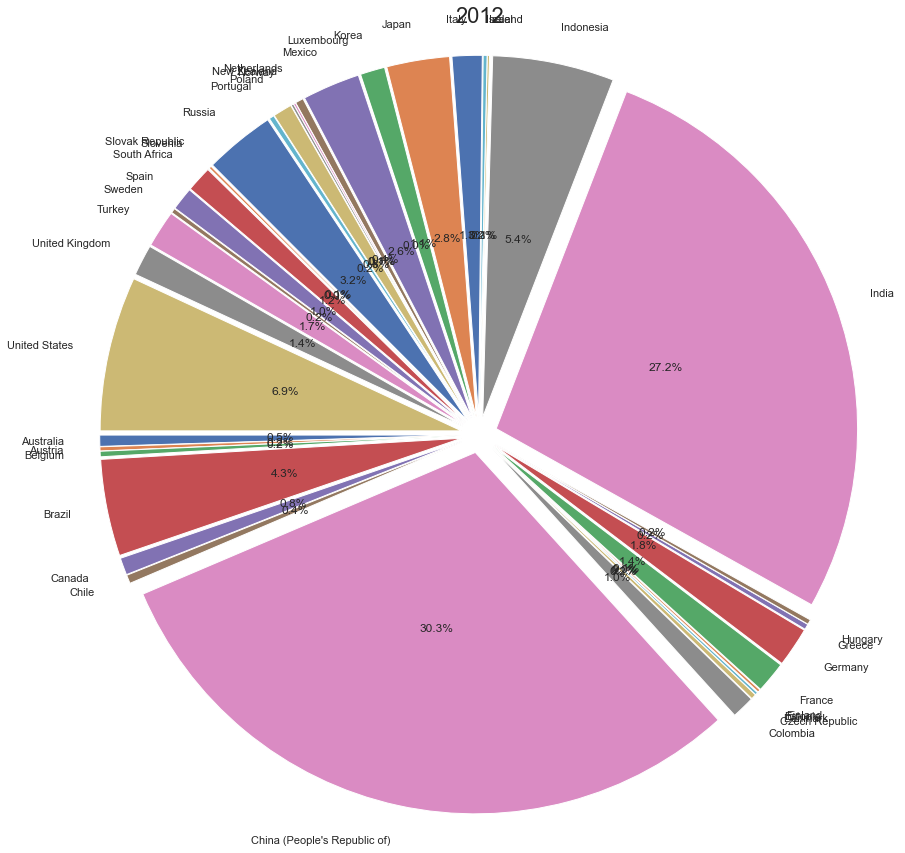

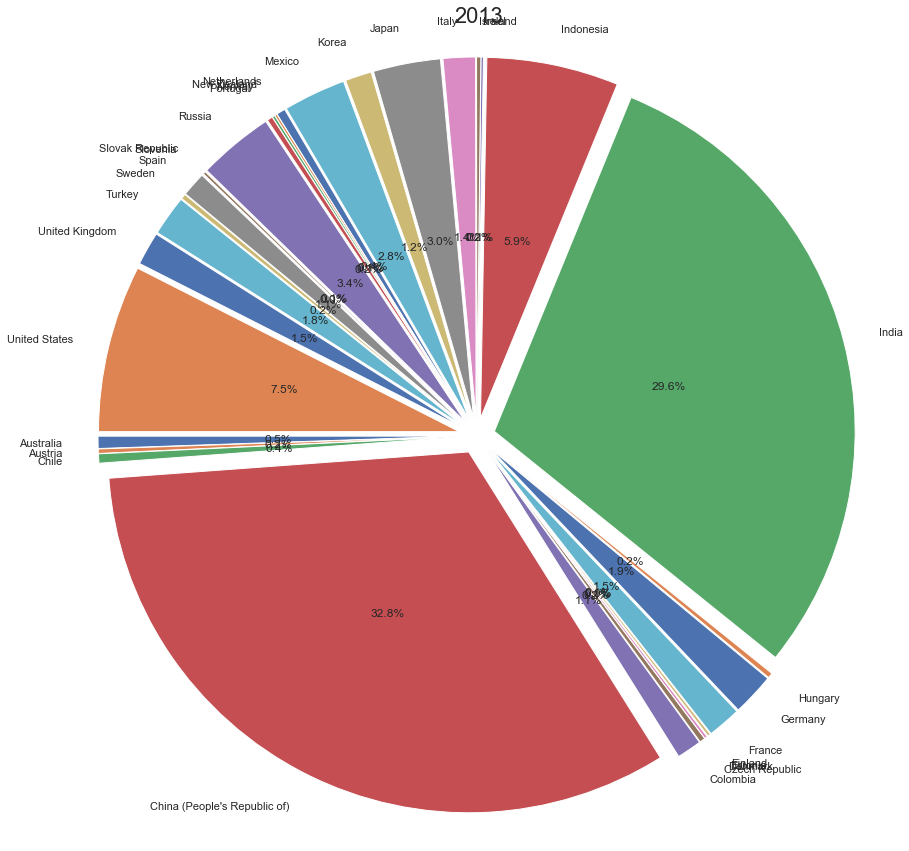

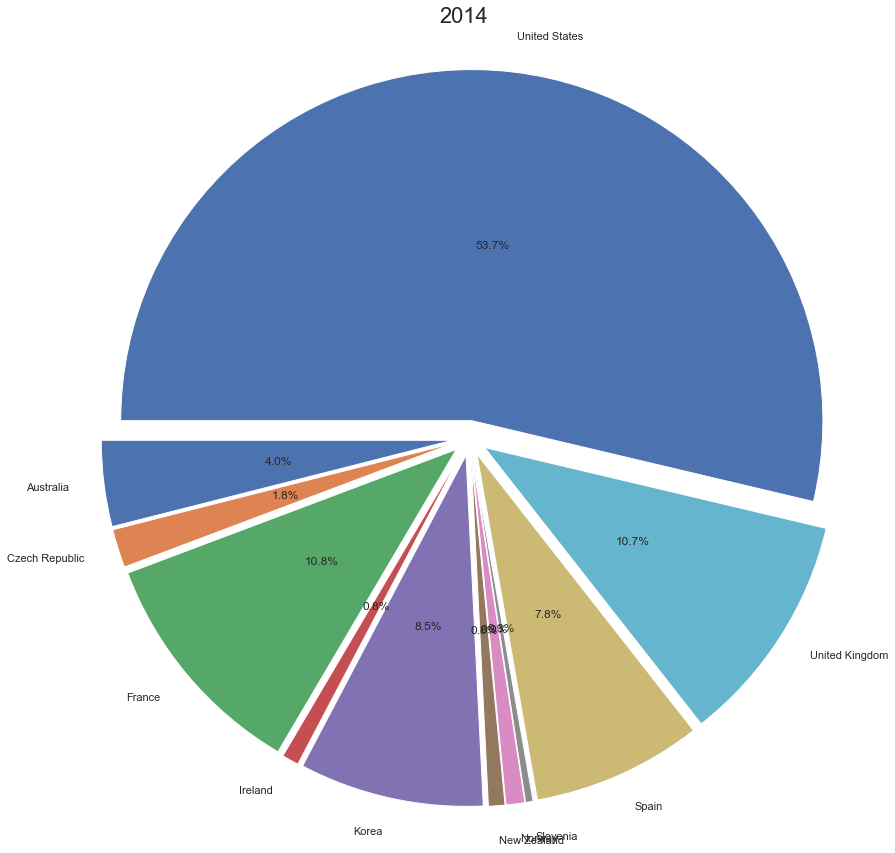

In [25]:
pie(countries_df_all_person)

# Гендерное распределение по странам

In [26]:
genders_df = {
    i: pd.DataFrame(columns=["Males", "Females", "All"],
                 index=sorted(dt['Country'].unique())).transpose()
    for i in dt['Time'].unique()
}
df1 = dt[dt['Subject'] == 'Population (hist5) All ages']

for i in genders_df.keys():
    df2 = df1[df1['Time'] == i]
    df_f = df2[df2['Sex'] == 'Females']
    df_f.index = df_f['Country']
    df_f = df_f['Value']
    #print(df_f.transpose())
    df_m = df2[df2['Sex'] == 'Males']
    df_m.index = df_m['Country']
    df_m = df_m['Value']
    genders_df[i].loc['Males'] = df_m
    genders_df[i].loc['Females'] = df_f
    genders_df[i].loc['All'] = df_m + df_f
    genders_df[i] = genders_df[i].transpose().dropna()
    genders_df[i]['Country'] = genders_df[i].index

genders_df[2000]

,Males,Females,All,Country
Australia,9443000.0,9585000.0,19028000.0,Australia
Austria,3874717.0,4136848.0,8011565.0,Austria
Belgium,5012016.0,5239233.0,10251249.0,Belgium
Brazil,84350720.0,86929160.0,171279880.0,Brazil
Canada,15193960.0,15491770.0,30685730.0,Canada
Chile,7620300.0,7777484.0,15397784.0,Chile
Colombia,19883770.0,20411790.0,40295560.0,Colombia
Czech Republic,4999326.0,5273177.0,10272503.0,Czech Republic
Denmark,2639221.0,2700396.0,5339617.0,Denmark
Estonia,639628.0,739714.0,1379342.0,Estonia


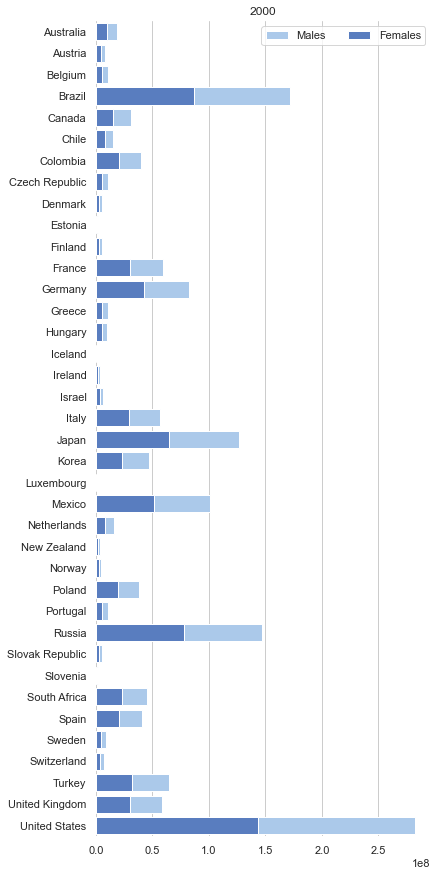

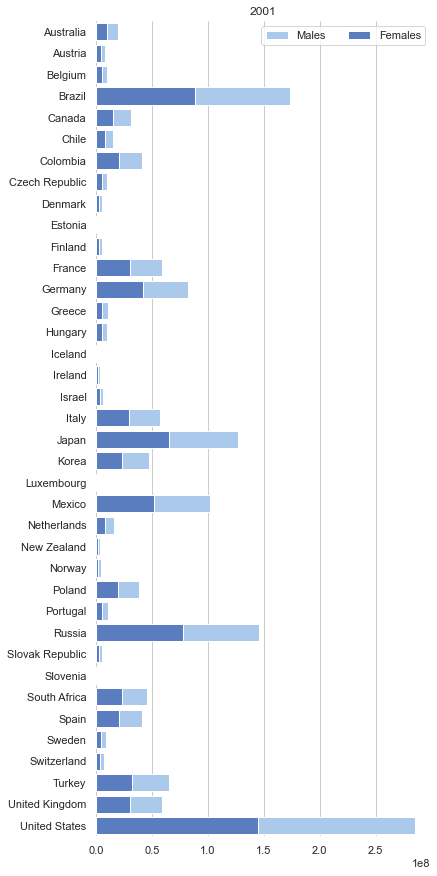

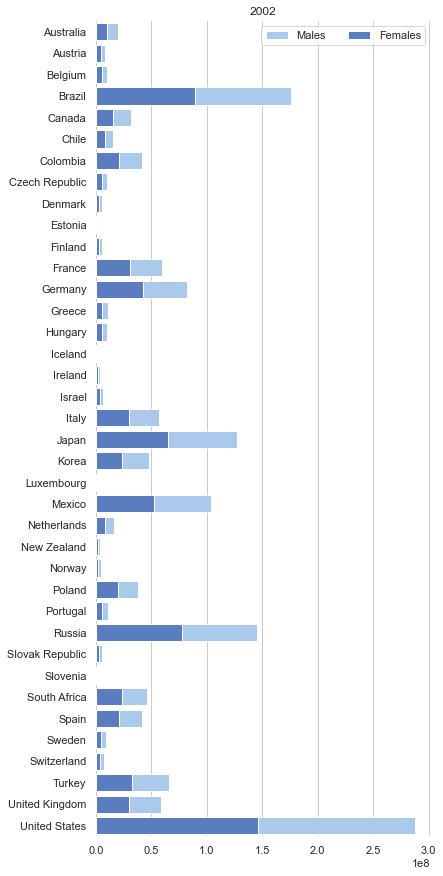

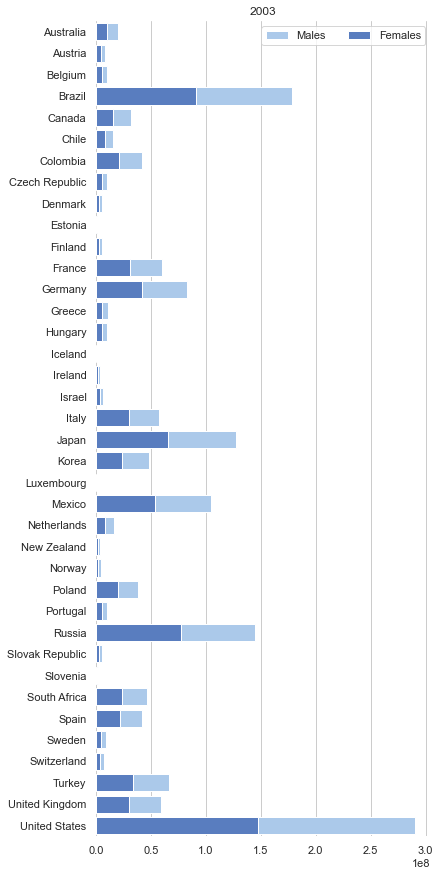

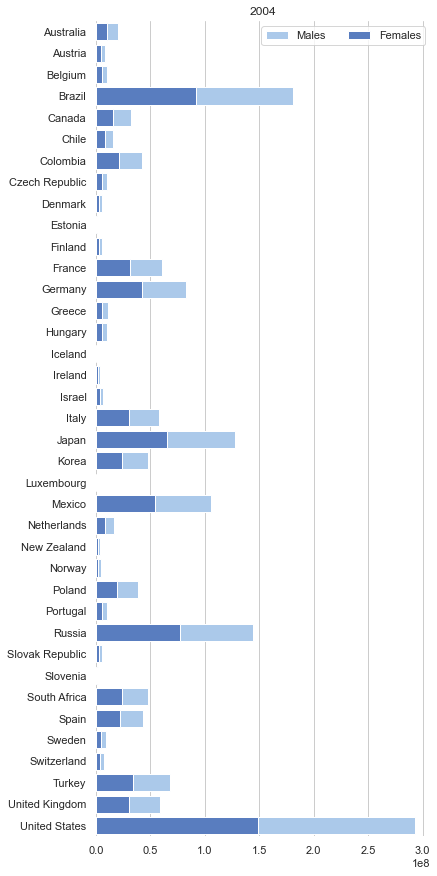

...

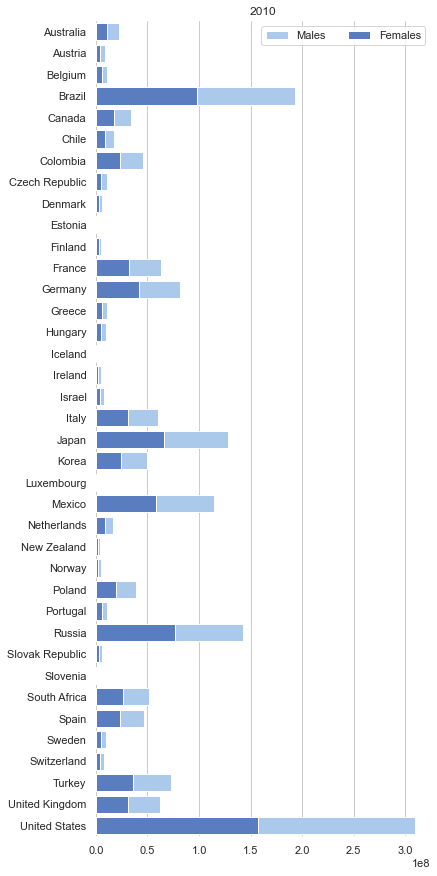

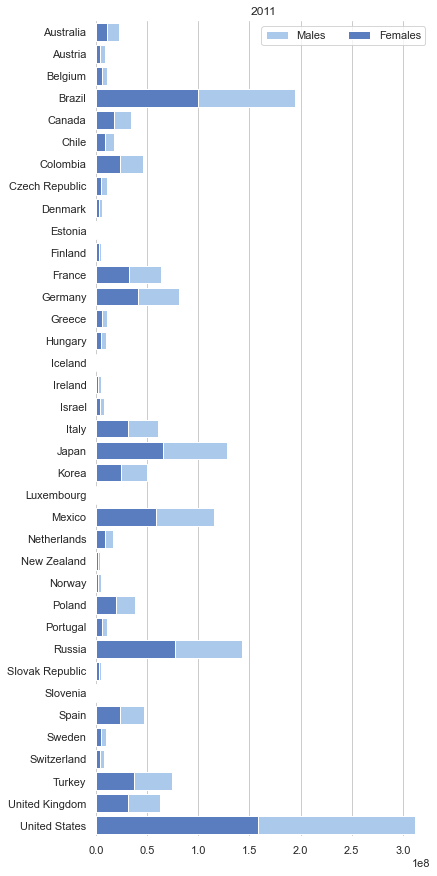

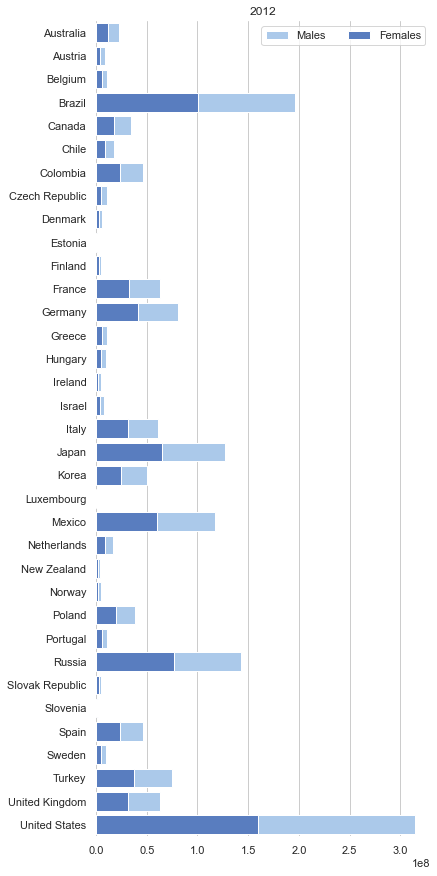

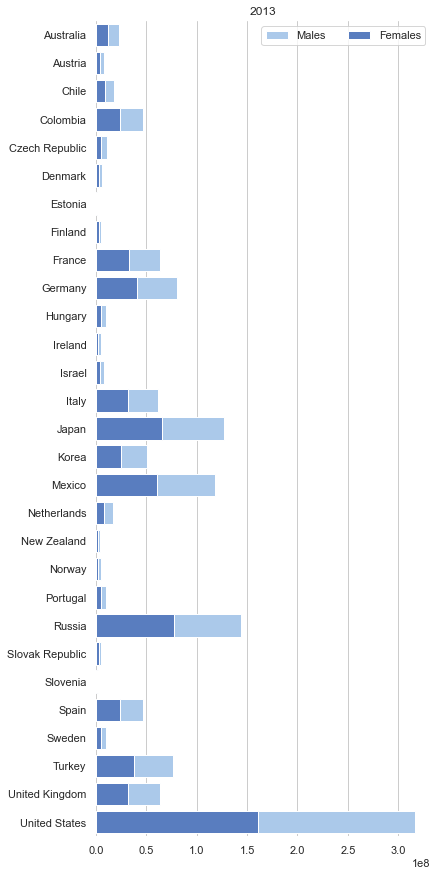

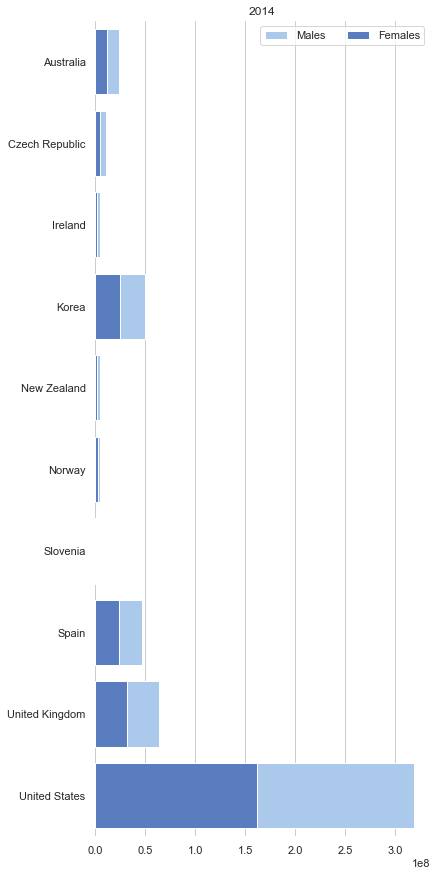

In [27]:
for i in genders_df.keys():
    sns.set_theme(style="whitegrid")

    # Initialize the matplotlib figure
    f, ax = plt.subplots(figsize=(6, 15))

    # Plot the total crashes
    sns.set_color_codes("pastel")
    sns.barplot(x="All", y='Country', data=genders_df[i],
                label="Males", color="b")

    # Plot the crashes where alcohol was involved
    sns.set_color_codes("muted")
    sns.barplot(x="Females", y='Country', data=genders_df[i],
                label="Females", color="b")

    # Add a legend and informative axis label
    ax.legend(ncol=2, loc="upper right", frameon=True)
    ax.set(ylabel="", xlabel="", title=i)
    sns.despine(left=True, bottom=True)
